# Data
* calcium imaging
* behavior tracking
    * position of male along herm, relative to vulva and tips of herm
    * velocity of male (fwd vs bkwd, absolute vs relative to herm)
    * tail angle
    * spicule position
    * sperm release
* phases of behavior
    * searching: looking for herm, no contact
    * scanning: contact, looking for vulva, male crawls along herm
    * located vulva
    * sperm release ("postsperm" ON to "LtoVulva" increase): insert spicules in vulva, release sperm
    * refractory period: post sperm release


# Plan

* encoding and decoding models
    * which neurons are sensitive to which behavioral variables?
    * which neurons can be used to decode which behavioral variables?
* predicting future activity from current activity
    * latent activity (GCaMP deconvolution, what is known about indicator time constant?)
    * constrained network interactions (chemical and electrical synapses)
    * model activity as a "rate" vs voltage/conductance
    * need to upsample and model continuous time dynamics with discete time observations
    * with and without 
* analysis
    * which neurons are key to which behavioral phases?
    * what is the minimal neural circuit behind each behavioral phase?
    * predict perturbations?
    * neuron/synapse importances?

In [1]:
import os,sys,datetime
os.environ["CUDA_VISIBLE_DEVICES"]="2"
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
from pathlib import Path
import collections
import numpy as np
import scipy
import pandas as pd
from sklearn.linear_model import LinearRegression
pd.options.display.max_columns=999
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.distributions as dist
from torch.autograd import Variable
import torch.utils.data as Data

In [2]:
import matplotlib.pyplot as plt
# # plt.rcParams['image.cmap'] = 'magma'
plt.rcParams["animation.html"] = "jshtml"
import matplotlib.animation
%matplotlib inline

import seaborn as sns # Used only to set up plots
sns.set_context(context = 'talk')
# sns.set_context(context='paper')
# plt.style.use('dark_background')
# plt.rcParams['figure.facecolor'] = '#272b30'
# plt.rcParams['image.cmap'] = 'viridis' 

In [3]:
#sys.path.append('/groups/turaga/home/turagas/research/')
%load_ext autoreload
%autoreload 2

In [4]:
basepath=Path.home()/'Samuel_Susoy_mating/'

In [5]:
net=pd.read_csv(basepath/'synaptic_partners_v1.csv', skipinitialspace = True, quotechar = '"')
neuron_annot=pd.read_csv(basepath/'transmitters_and_annotations.csv',index_col=0)

In [6]:
# folder = basepath/'normalized_activity_id/'
folder = basepath/'normalized_activity_id_not_filtered/'
files = sorted(list(Path.iterdir(folder)))
data = [pd.read_csv(file,index_col=0) for file in files]
actcols = data[0].columns[:-12]
behcols = data[0].columns[-12:-1]
activity = [d[actcols] for d in data]
behavior = [d[behcols] for d in data]
files = [file.stem for file in files]
dataset_id = [d['dataset'][1] for d in data]

In [7]:
data[0].columns[-13:]

Index(['PVT', 'Velocity', 'Rel.Velocity', 'Speed', 'Rel.Speed', 'TailAngle',
       'LtoTips', 'LtoVul', 'Spicules', 'pos_x', 'pos_y', 'PostSperm',
       'dataset'],
      dtype='object')

In [8]:
activity[0].columns

Index(['HOA', 'HOB', 'PVZ', 'PCBL', 'PCCL', 'PCAL', 'SPCL', 'PVY', 'PVX',
       'PVV', 'PHCL', 'PLML', 'PHDL', 'VA10', 'VA11', 'AS11', 'VB11', 'EF1',
       'EF2', 'EF3', 'DVB', 'CP08', 'CA08', 'CA09', 'CP09', 'PVPR', 'R1AL',
       'R1BL', 'R2AL', 'R2BL', 'R6AL', 'R4AL', 'R3AL', 'PHAL', 'SPDL', 'VD13',
       'VD12', 'DB07', 'PDB', 'SPVL', 'VD11', 'DVA', 'VA12', 'DX1', 'DX2',
       'PDC', 'AS10', 'DA07', 'DD06', 'PHBL', 'R8BL', 'R9BL', 'PVPL', 'PVT'],
      dtype='object')

In [9]:
behavior[0].columns

Index(['Velocity', 'Rel.Velocity', 'Speed', 'Rel.Speed', 'TailAngle',
       'LtoTips', 'LtoVul', 'Spicules', 'pos_x', 'pos_y', 'PostSperm'],
      dtype='object')

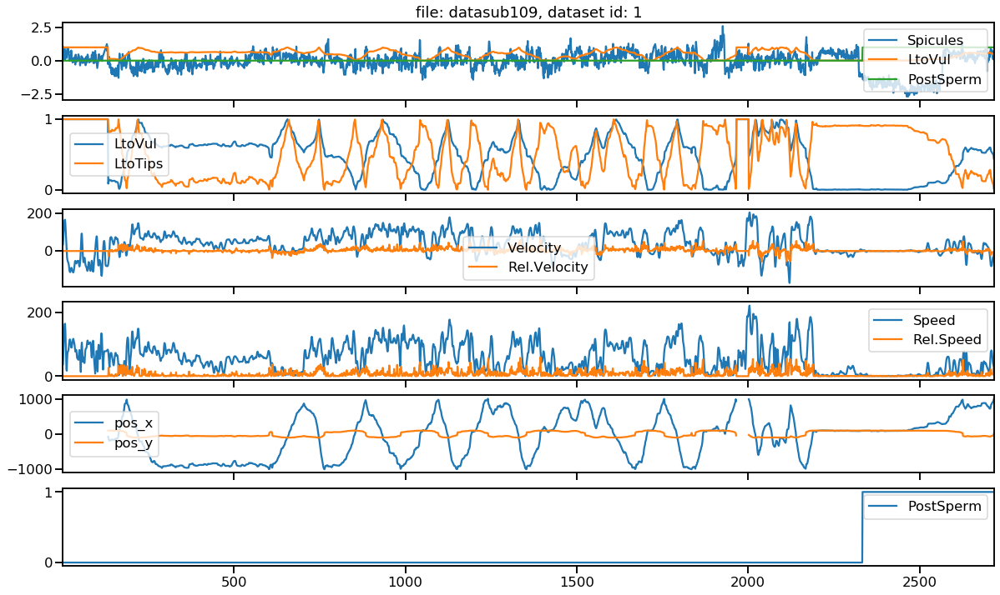

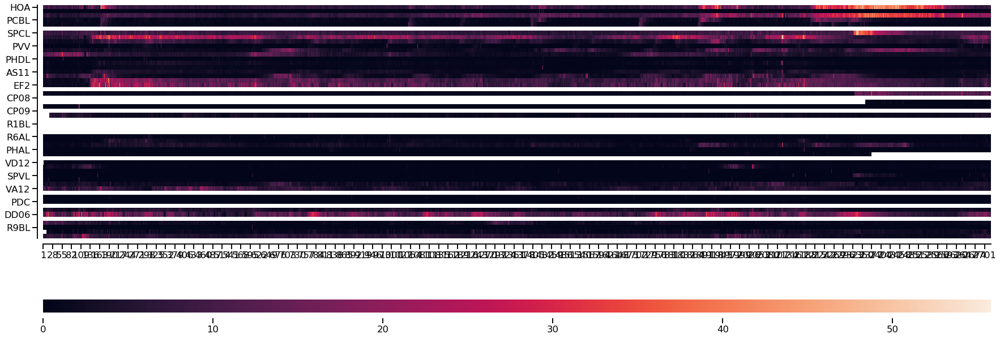

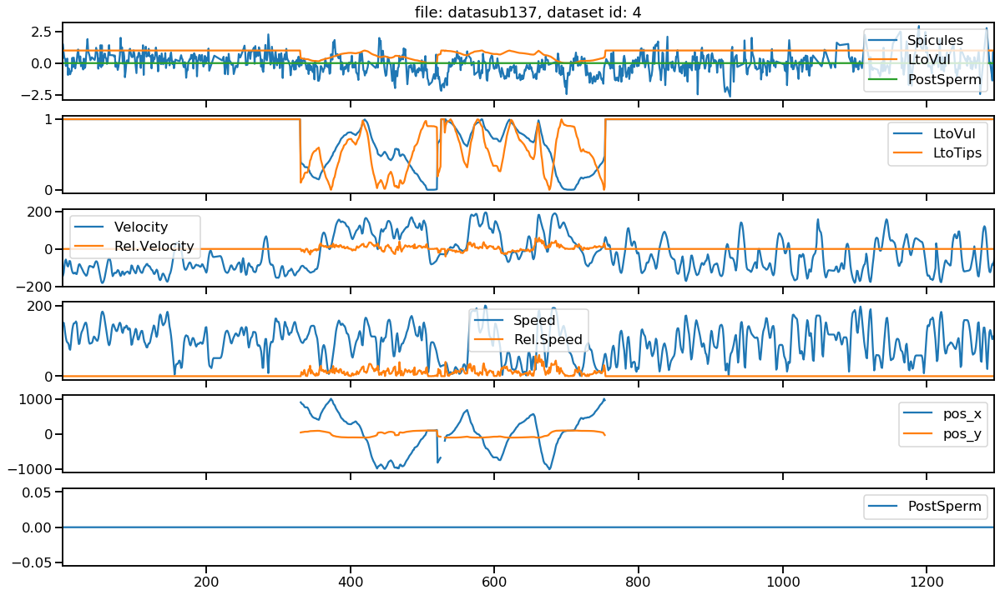

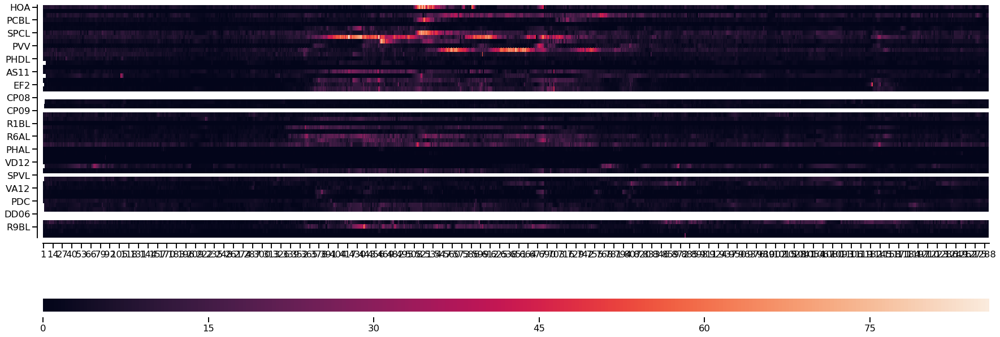

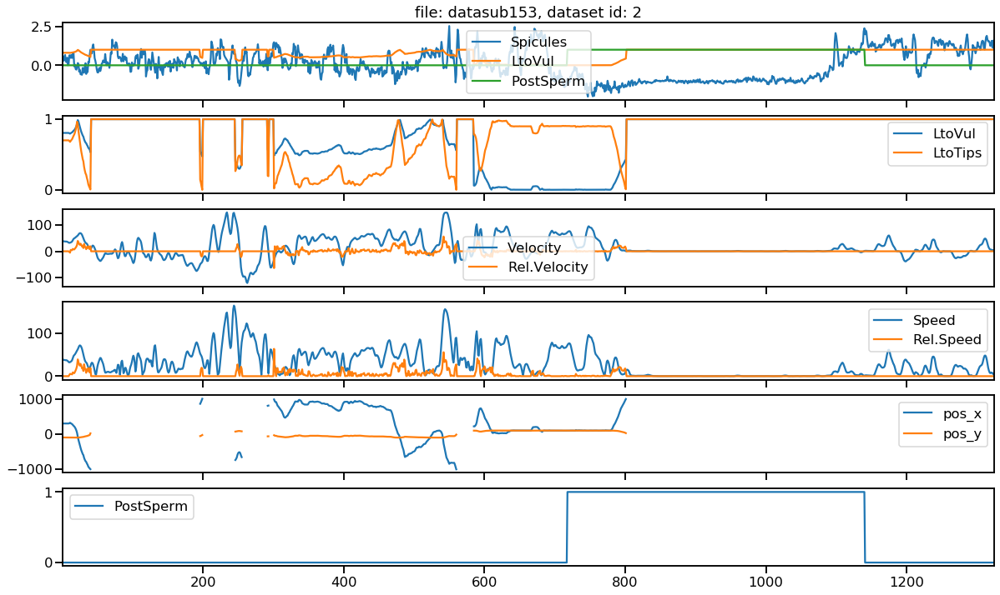

...

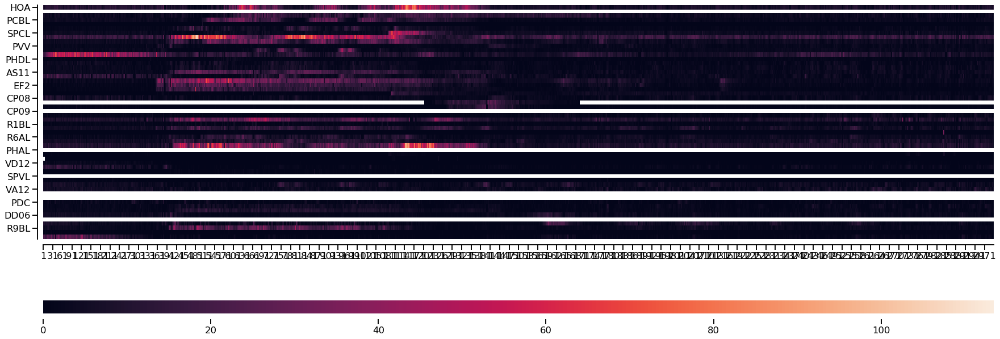

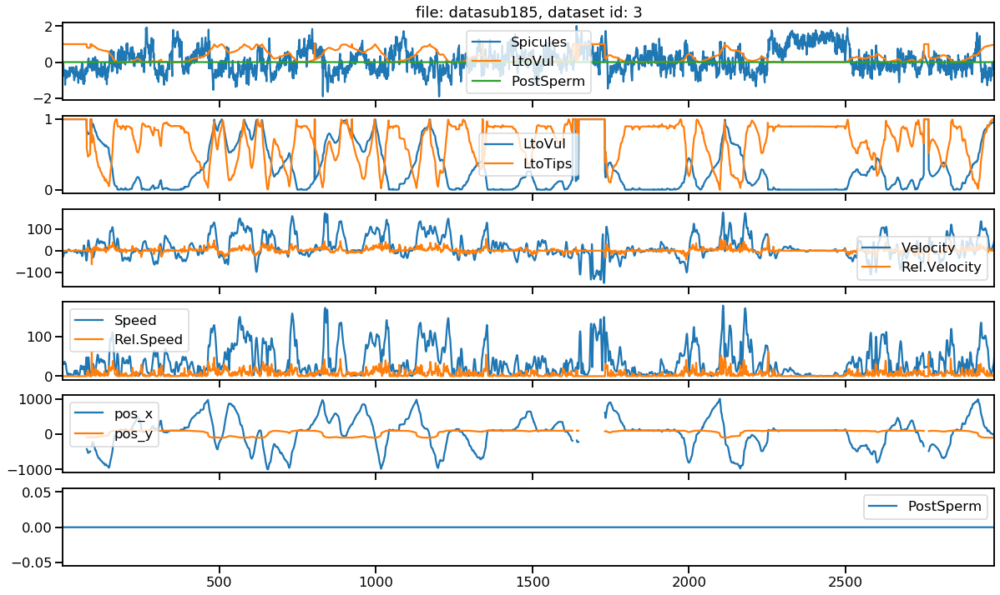

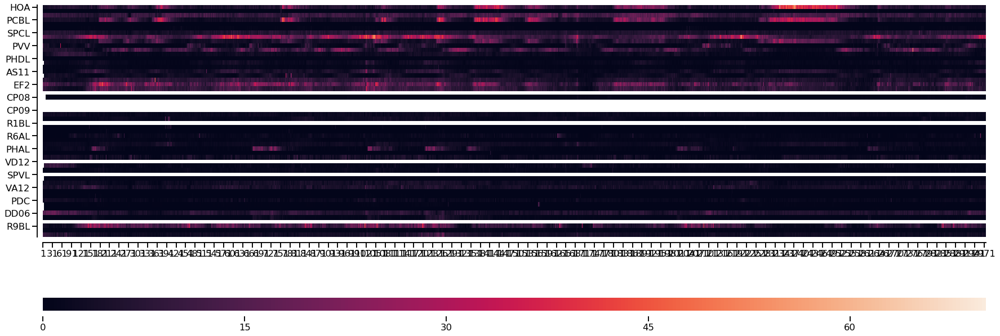

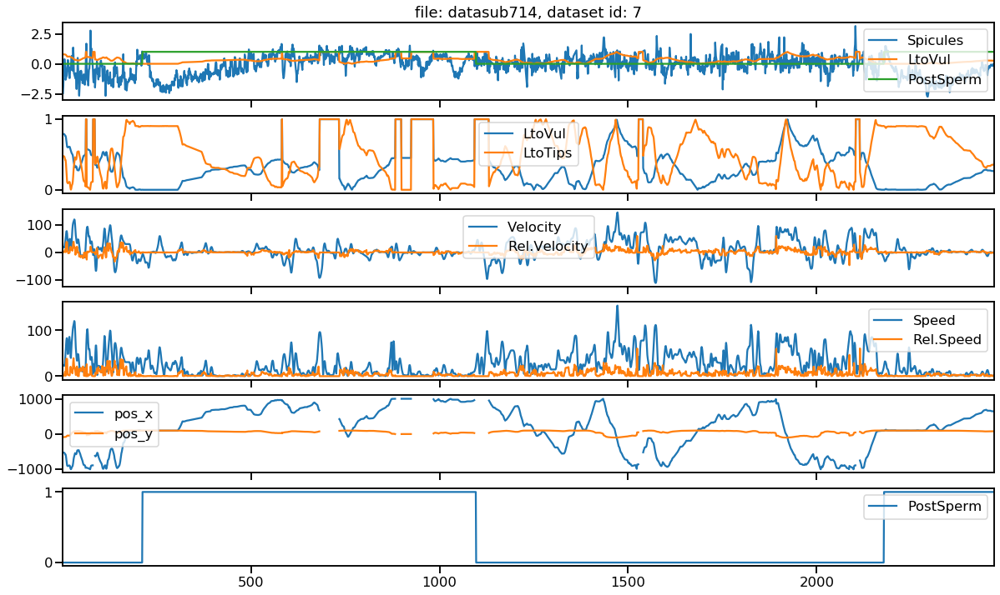

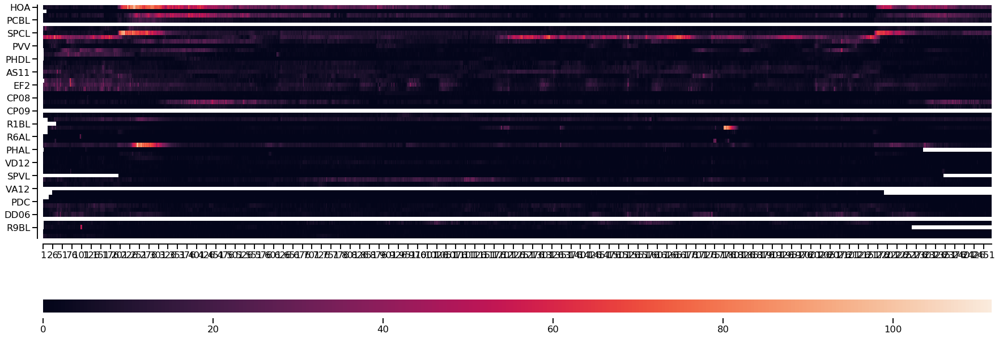

In [57]:
activity_list = ['HOA', 'HOB', 'PVZ', 'PCBL', 'PCCL', 'PCAL', 'SPCL', 'PVY', 'PVX',
       'PVV', 'PHCL', 'PLML', 'PHDL', 'VA10', 'VA11', 'AS11', 'VB11', 'EF1',
       'EF2', 'EF3', 'DVB', 'CP08', 'CA08', 'CA09', 'CP09', 'PVPR', 'R1AL',
       'R1BL', 'R2AL', 'R2BL', 'R6AL', 'R4AL', 'R3AL', 'PHAL', 'SPDL', 'VD13',
       'VD12', 'DB07', 'PDB', 'SPVL', 'VD11', 'DVA', 'VA12', 'DX1', 'DX2',
       'PDC', 'AS10', 'DA07', 'DD06', 'PHBL', 'R8BL', 'R9BL', 'PVPL', 'PVT']
behavior_list = ['Velocity', 'Rel.Velocity', 'Speed', 'Rel.Speed', 'TailAngle',
       'LtoTips', 'LtoVul', 'Spicules', 'pos_x', 'pos_y', 'PostSperm']

for file,d,d_id in zip(files,data,dataset_id):
    f,axes = plt.subplots(6,1,sharex=True,figsize=(20,12))
    axes[0].set_title('file: {}, dataset id: {}'.format(file,d_id))
    d[['Spicules','LtoVul','PostSperm']].plot(ax=axes[0])
    d[['LtoVul','LtoTips']].plot(ax=axes[1])
    d[['Velocity','Rel.Velocity']].plot(ax=axes[2])
    d[['Speed','Rel.Speed']].plot(ax=axes[3])
    d[['pos_x','pos_y']].plot(ax=axes[4])
    d[['PostSperm']].plot(ax = axes[5])
    #plt.figure()
    grid_kws = {"height_ratios": (.9, .05), "hspace": 0.5}
    f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws, figsize = (30,10))
    sns.heatmap(d[activity_list].transpose(), cbar_ax = cbar_ax, ax = ax, cbar_kws = {"orientation":"horizontal"})
    sns.despine(offset=10)

In [11]:
torch.manual_seed(1)

class Net(torch.nn.Module):
    def __init__ (self, n_feature, n_output):
        """
        Single Layer Linear Neural Network
        """
        super(Net, self).__init__()
        self.linear2 = torch.nn.Linear(n_feature, n_output)
        self.tanh = torch.tanh
        self.n_feature = n_feature
        self.n_output = n_output
        
    def __weighted_MSELoss(self,out_data, target_data, missing_data):
        loss = 0.5*torch.mean(-(missing_data - 1)*(out_data - target_data)**2)
        return loss
    
    def __MSELoss(self, out_data, target_data):
        loss = 0.5*torch.mean((out_data - target_data)**2)
        return loss
    
    def forward(self, x):
        return self.linear2(x) 
    
    def train(self, in_data, out_data, learning_rate = 1e-5, epochs = 1000, batch_size = 128):
        """
        Method for training the linear regression network without missing input and output data.
        
        Parameters:
        
        in_data - input_data
        out_data - target output data
        learning_rate  = 1e-4
        epochs = 1000
        batchsize = 128
        
        Returns:
        
        List of average loss per epoch
        """
        optimizer, loss_list = torch.optim.Adam(self.parameters(), lr = learning_rate, weight_decay = 1e-5) , []
        criterion, input_array = self.__MSELoss, in_data  
        in_tensor = torch.from_numpy(input_array).unsqueeze(0).to(torch.float32).cuda()
        target = torch.from_numpy(out_data).unsqueeze(0).to(torch.float32).cuda() 
        for epoch in range(epochs):
            loss_sum = 0
            for i in range(int(in_data.shape[0]/batch_size)):
                optimizer.zero_grad()
                if i < int(in_data.shape[0]/batch_size - 1):
                    output = self.forward(in_tensor[:,i*batch_size:(i+1)*batch_size,:])
                    loss = criterion(output, target[:,i*batch_size:(i+1)*batch_size,:])
                else:
                    output = self.forward(in_tensor[:,i*batch_size:,:])
                    loss = criterion(output,target[:,i*batch_size:,:])
                loss.backward()
                optimizer.step()
                loss_sum += loss.item()
            epoch_loss = loss_sum/(in_data.shape[0]/batch_size)
            loss_list.append(epoch_loss)
        return loss_list
    
    
    def mtrain(self, in_data, missing_in, out_data, missing_out,learning_rate  = 1e-4, epochs = 1000, batch_size = 128):
        """
        Method for training the linear regression network with missing input and output data. Removes the missing
        output data from the loss function and chooses an optimal constant value to replace missing input data by concatenating 
        an array m[i] such that m[i] = 1 if x[i] = NaN and m[i] = 0 if x[i] != NaN
        
        Parameters:
        
        in_data - input_data
        missing_in - matrix of missing input_data values
        out_data - target output data
        missing_out - matrix of missing output values
        learning_rate  = 1e-4
        epochs = 1000
        batchsize = 128
        
        Returns:
        
        List of average loss per epoch
        """
        optimizer, loss_list = torch.optim.Adam(self.parameters(), lr = learning_rate), []
        criterion, input_array = self.__weighted_MSELoss, np.concatenate((in_data, missing_in),1) 
        in_tensor = torch.from_numpy(input_array).unsqueeze(0).to(torch.float32).cuda()
        target = torch.from_numpy(out_data).unsqueeze(0).to(torch.float32).cuda()
        missing_out_tensor = torch.from_numpy(missing_out).unsqueeze(0).to(torch.float32).cuda()
        for epoch in range(epochs):
            loss_sum = 0
            for i in range(int(in_data.shape[0]/batch_size)):
                optimizer.zero_grad()
                if i < int(in_data.shape[0]/batch_size - 1):
                    output = self.forward(in_tensor[:,i*batch_size:(i+1)*batch_size,:])
                    loss = criterion(output,target[:,i*batch_size:(i+1)*batch_size,:],missing_out_tensor[:,i*batch_size:(i+1)*batch_size,:])
                else:
                    output = self.forward(in_tensor[:,i*batch_size:,:])
                    loss = criterion(output,target[:,i*batch_size:,:],missing_out_tensor[:,i*batch_size:,:])
                loss.backward()
                optimizer.step()
                loss_sum += loss.item()
            epoch_loss = loss_sum/(in_data.shape[0]/batch_size)
            loss_list.append(epoch_loss)
        return loss_list        
        
    def predict(self, in_data):
        """
        Predict using trained network assuming no missing output data.
        
        Parameters:
        
        in_data, out_dim
        
        Returns:
        
        prediction values in tensor form
        """
        out_data = torch.zeros(in_data.shape[0], self.n_output)
        input_array = in_data       
        for image in range(in_data.shape[0]):
            in_tensor = torch.from_numpy(input_array[image,:]).unsqueeze(0).to(torch.float32).cuda()
            output = self.forward(in_tensor)
            out_data[image,:] = output
        return out_data
    
    
    def mpredict(self, in_data, missing_in):
        """
        Predict using trained network assuming missing output data.
        
        Parameters:
        in_data, out_dim
        missing_in - matrix of missing input_data values
        
        Returns:
        
        prediction values in tensor form
        """
        out_data = torch.zeros(in_data.shape[0], self.n_output)
        input_array = np.concatenate((in_data,missing_in),1)         
        for image in range(in_data.shape[0]):
            in_tensor = torch.from_numpy(input_array[image,:]).unsqueeze(0).to(torch.float32).cuda()
            output = self.forward(in_tensor)
            out_data[image,:] = output
        return out_data

In [12]:
mdecode_output_list, nmdecode_output_list, skdecode_output_list = [], [], [] 
mdecode_weight_list, nmdecode_weight_list = [], []
mdecode_loss_list, nmdecode_loss_list = [],[]
pd.options.mode.chained_assignment = None
for file,d,d_id in zip(files,data,dataset_id):
    act_df, bev_df = d[activity_list],d[behavior_list] # dataframes with all activities and behaviors
    bev_df.loc[bev_df['LtoVul'] == 1,['LtoVul']], bev_df.loc[bev_df['LtoTips'] == 1,['LtoTips']] = np.NaN, np.NaN
    bev_df.loc[:,bev_df.columns != 'PostSperm'] = (bev_df.loc[:,bev_df.columns != 'PostSperm'] - bev_df.loc[:,bev_df.columns != 'PostSperm'].mean())/(bev_df.loc[:,bev_df.columns != 'PostSperm'].std())
    act_df = (act_df - act_df.mean())/act_df.std()
    act_drop, bev_drop = act_df.dropna(axis=1,how = 'all'),bev_df.dropna(axis = 1,how = 'all') # dataframes with NaN columns dropped
    #normalize "TailAngle" "pos_x" and "pos_y" to [0,1]
    m_act_matrix, m_bev_matrix = act_df.values,bev_df.values # ndarrays with all act and bev values. no drops
    nm_act_matrix, nm_bev_matrix = act_drop.values, bev_drop.values # ndarrays with dropped act and bev values
    miss_act, miss_bev = np.zeros(m_act_matrix.shape), np.zeros(m_bev_matrix.shape) # initialize arrays for denoting missing values
    miss_act[np.isnan(m_act_matrix)], miss_bev[np.isnan(m_bev_matrix)] = 1,1 # fill missing arrays with 1 for NaN values
    nm_act_matrix[np.isnan(nm_act_matrix)], nm_bev_matrix[np.isnan(nm_bev_matrix)] = 0,0 
    m_act_matrix[np.isnan(m_act_matrix)], m_bev_matrix[np.isnan(m_bev_matrix)] = 0,0 # change NaNs to 0
    
#     nm_act_matrix, nm_bev_matrix = nm_act_matrix.cuda(), nm_bev_matrix.cuda()
#     m_act_matrix, m_bev_matrix = m_act_matrix.cuda(), m_bev_matrix.cuda()
#     miss_act, miss_bev = miss_act.cuda(), miss_bev.cuda()
    
    Nm = m_act_matrix.shape[1] # initial number of neurons
    Tm = m_act_matrix.shape[0] # number of images
    Om = m_bev_matrix.shape[1] # number of behavioral data types
    Nn = nm_act_matrix.shape[1] 
    Tn = nm_act_matrix.shape[0]
    On = nm_bev_matrix.shape[1]
    print("Dataset: " + str(file) + ", Input dimension: " + str(Nn)+ ", Output dimension:  " + str(On)+ ", T: " + str(Tn))
        
    # Initialize, Train and Predict with Network that replaces NaNs with 0s
    epochs = 2500
    output = np.ndarray(shape = nm_bev_matrix.shape)
    nmdecode_net = Net(n_feature = Nn, n_output = On)
    nmdecode_net.cuda()
    nmdecode_loss = nmdecode_net.train(nm_act_matrix, nm_bev_matrix, learning_rate = 1e-3, epochs = epochs, batch_size = 128)
    nmdecode_loss_list.append(nmdecode_loss)
    nmoutput_ndarr = nmdecode_net.predict(in_data = nm_act_matrix).detach().numpy()
    nmdecode_weights = [p.detach().cpu().numpy() for p in nmdecode_net.parameters()]
    nmdecode_output_list.append(nmoutput_ndarr)
    nmdecode_weight_list.append(nmdecode_weights)
    
    # Initialize, Train and Predict with Network that accounts for missing data    
    epochs = 2500
    output = np.ndarray(shape = m_bev_matrix.shape)
    mdecode_net = Net(n_feature = 2*Nm, n_output = Om)
    mdecode_net.cuda()
    mdecode_loss = mdecode_net.mtrain(m_act_matrix, miss_act, m_bev_matrix, miss_bev,learning_rate = 1e-3, epochs = epochs, batch_size = 128)
    mdecode_loss_list.append(mdecode_loss)
    moutput_ndarr = mdecode_net.mpredict(in_data = m_act_matrix, missing_in = miss_act).detach().numpy()
    mdecode_weights = [p.detach().cpu().numpy() for p in mdecode_net.parameters()]
    mdecode_output_list.append(moutput_ndarr)
    mdecode_weight_list.append(mdecode_weights)
    
    # Initialize Network
    reg = LinearRegression(fit_intercept=True, normalize = False)
    reg.fit(nm_act_matrix,nm_bev_matrix)
    sk_prediction = reg.predict(nm_act_matrix)
    skdecode_output_list.append(sk_prediction)

#     plt.figure(figsize=(20,3))
#     plt.title('Sklearn Regression Coefficients')
#     plt.ylabel('Output')
#     plt.xlabel('Input')
#     plt.imshow(reg.coef_, vmin = -0.5, vmax = 0.5)
#     plt.colorbar()
print('Completed all models')

Dataset: datasub109, Input dimension: 42, Output dimension:  11, T: 2719
Dataset: datasub137, Input dimension: 48, Output dimension:  11, T: 1294
Dataset: datasub153, Input dimension: 50, Output dimension:  11, T: 1325
Dataset: datasub182, Input dimension: 42, Output dimension:  11, T: 2977
Dataset: datasub184, Input dimension: 47, Output dimension:  11, T: 3000
Dataset: datasub185, Input dimension: 46, Output dimension:  11, T: 2976
Dataset: datasub714, Input dimension: 50, Output dimension:  11, T: 2472
Completed all models


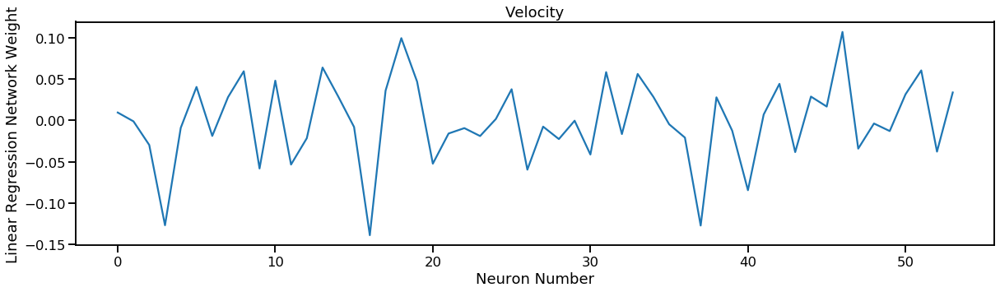

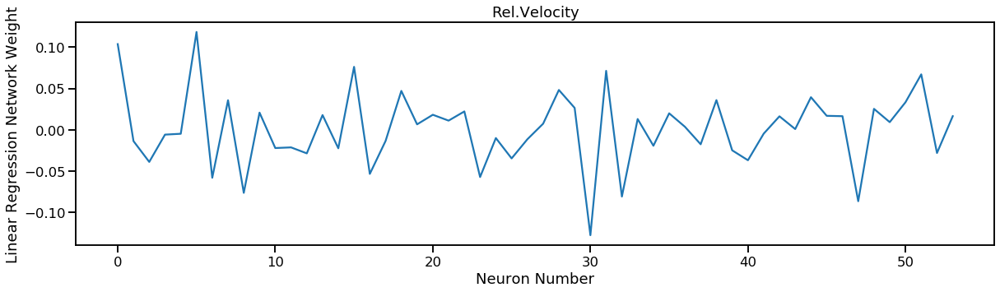

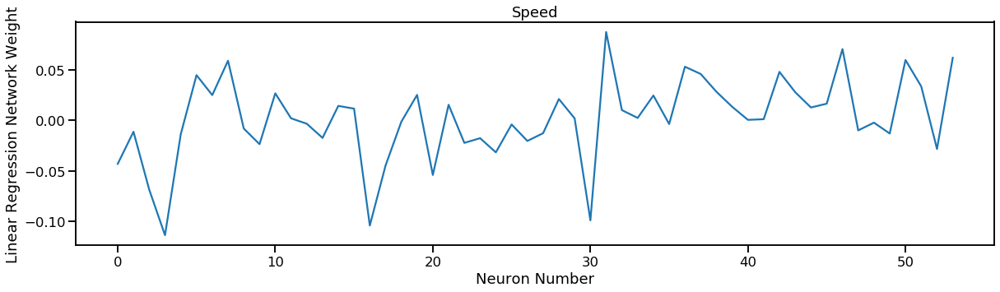

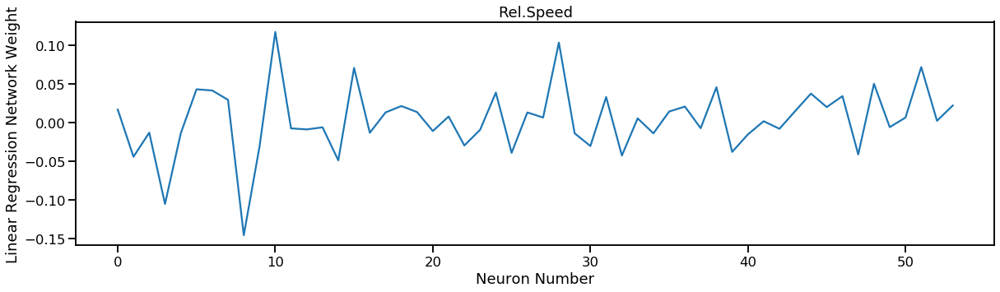

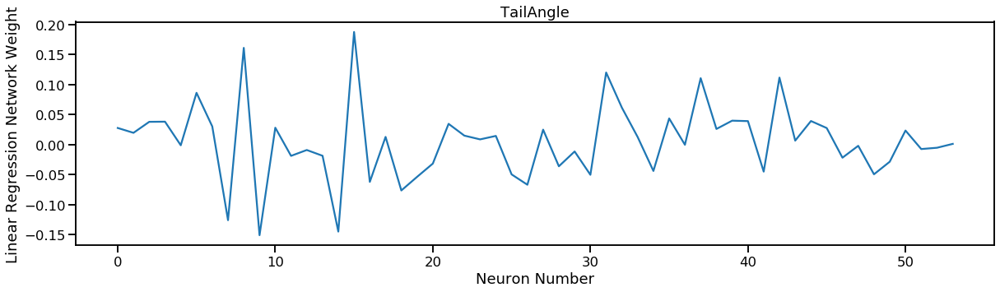

...

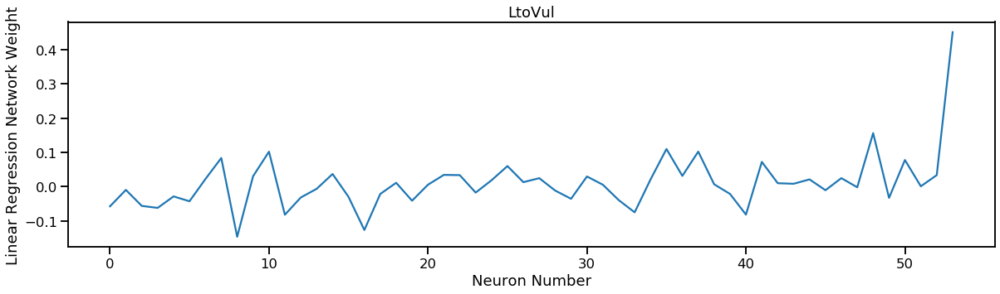

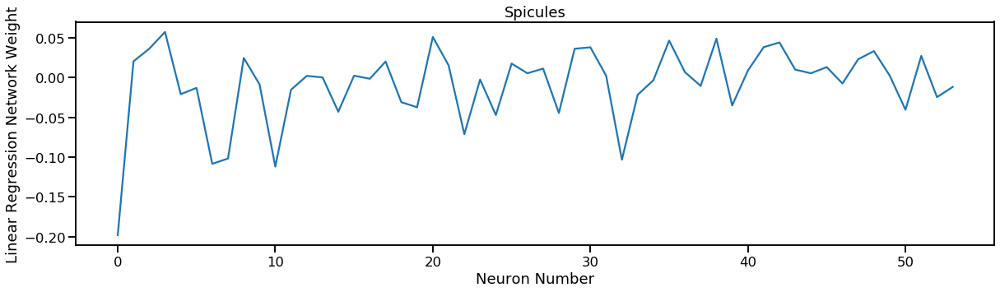

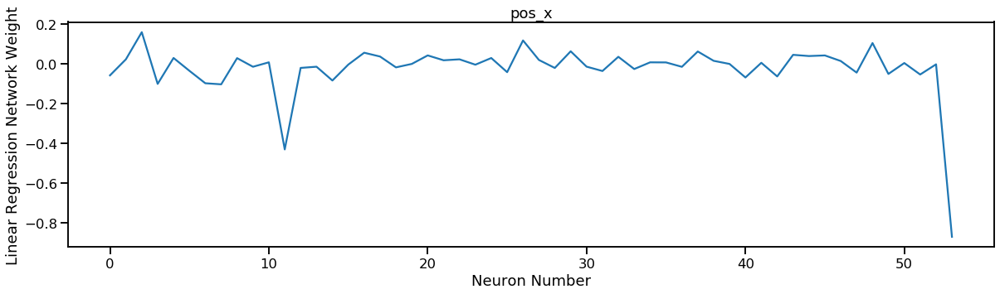

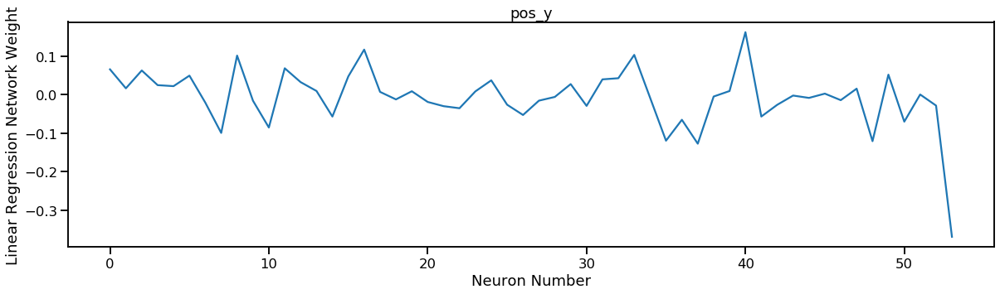

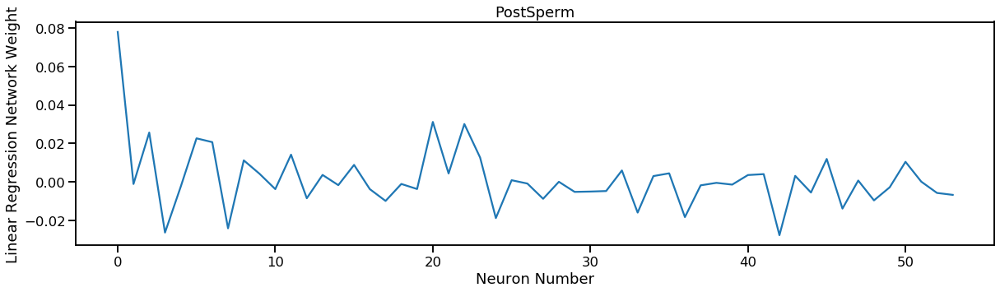

In [49]:
for i in range(len(behavior_list)):
    plt.figure(figsize = (20,5))
    plt.title(behavior_list[i])
    plt.ylabel("Linear Regression Network Weight")
    plt.xlabel("Neuron Number")
    sum_weights = np.zeros(54)
    for mweight in mdecode_weight_list:
        sum_weights += mweight[0][i,:54]
    plt.plot(sum_weights/7)

['Velocity', 'Rel.Velocity', 'Speed', 'Rel.Speed', 'TailAngle', 'LtoTips', 'LtoVul', 'Spicules', 'pos_x', 'pos_y', 'PostSperm']
['HOA', 'HOB', 'PVZ', 'PCBL', 'PCCL', 'PCAL', 'SPCL', 'PVY', 'PVX', 'PVV', 'PHCL', 'PLML', 'PHDL', 'VA10', 'VA11', 'AS11', 'VB11', 'EF1', 'EF2', 'EF3', 'DVB', 'CP08', 'CA08', 'CA09', 'CP09', 'PVPR', 'R1AL', 'R1BL', 'R2AL', 'R2BL', 'R6AL', 'R4AL', 'R3AL', 'PHAL', 'SPDL', 'VD13', 'VD12', 'DB07', 'PDB', 'SPVL', 'VD11', 'DVA', 'VA12', 'DX1', 'DX2', 'PDC', 'AS10', 'DA07', 'DD06', 'PHBL', 'R8BL', 'R9BL', 'PVPL', 'PVT']


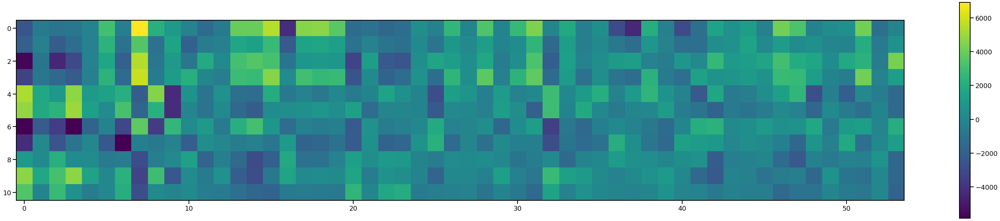

In [42]:
correlation_sum = np.zeros(shape = (len(behavior_list), len(activity_list)))
for d in data:
    act_df, bev_df = d[activity_list],d[behavior_list] # dataframes with all activities and behaviors
    bev_df.loc[bev_df['LtoVul'] == 1,['LtoVul']], bev_df.loc[bev_df['LtoTips'] == 1,['LtoTips']] = np.NaN, np.NaN
    bev_df.loc[:,bev_df.columns != 'PostSperm'] = (bev_df.loc[:,bev_df.columns != 'PostSperm'] - bev_df.loc[:,bev_df.columns != 'PostSperm'].mean())/(bev_df.loc[:,bev_df.columns != 'PostSperm'].std())
    act_df = (act_df - act_df.mean())/act_df.std()
    act_drop, bev_drop = act_df.dropna(axis=1,how = 'all'),bev_df.dropna(axis = 1,how = 'all') # dataframes with NaN columns dropped
    #normalize "TailAngle" "pos_x" and "pos_y" to [0,1]
    act_matrix, bev_matrix = act_df.values,bev_df.values
    act_matrix[np.isnan(act_matrix)], bev_matrix[np.isnan(bev_matrix)] = 0,0 
    corr = np.zeros(shape = (len(behavior_list), len(activity_list)))
    for i in range(len(behavior_list)):
        for j in range(len(activity_list)):
            corr[i,j] = np.dot(bev_matrix[:,i], act_matrix[:,j])
    correlation_sum += corr
plt.figure(figsize=(50,10))
plt.imshow(correlation_sum)
plt.colorbar()
print(behavior_list)
print(activity_list)

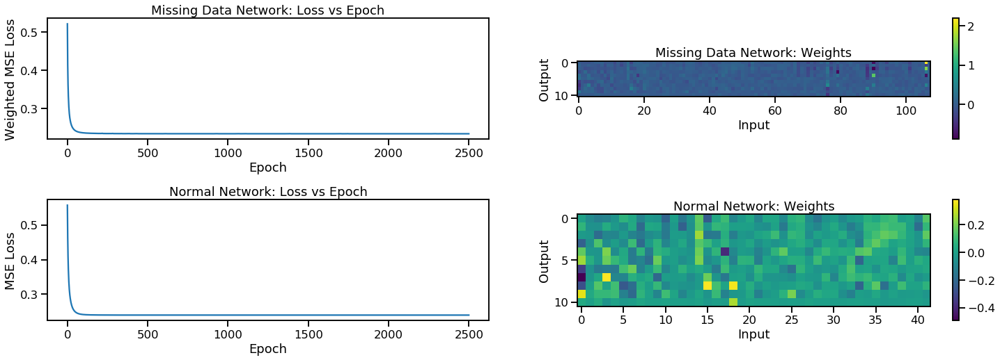

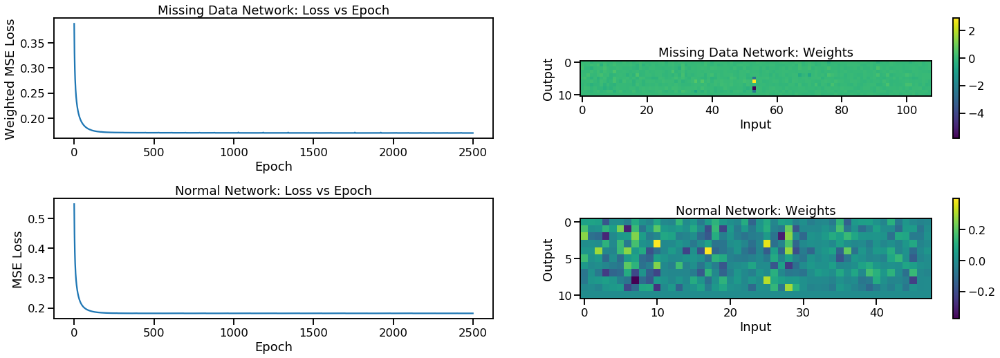

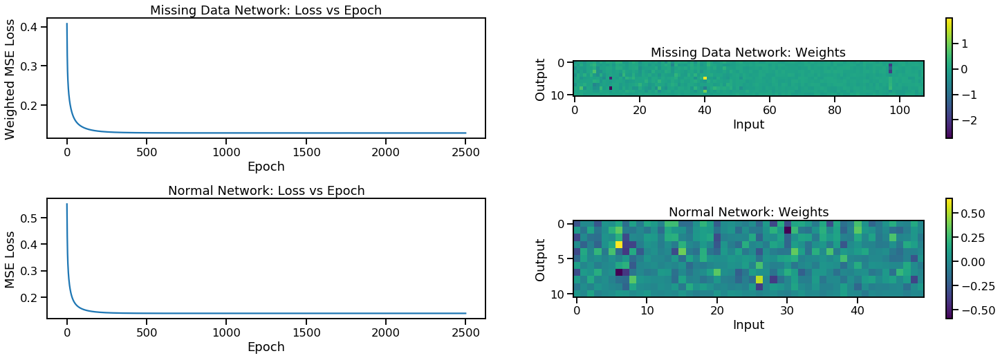

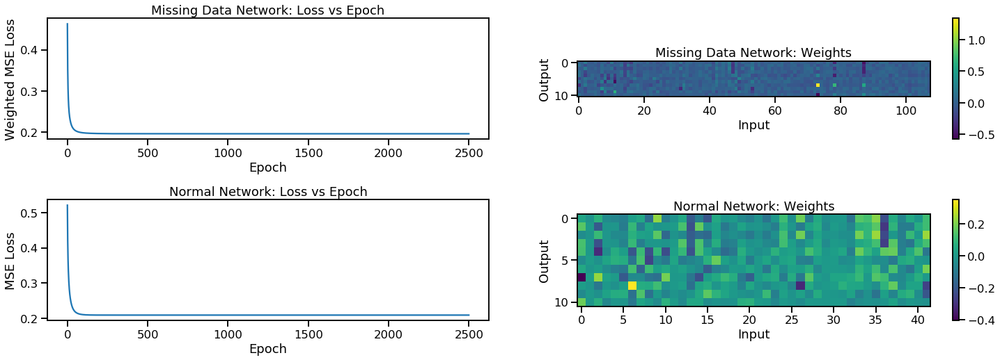

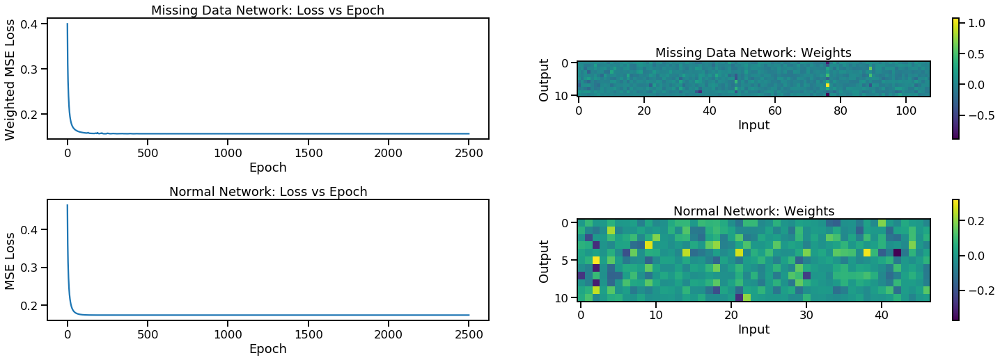

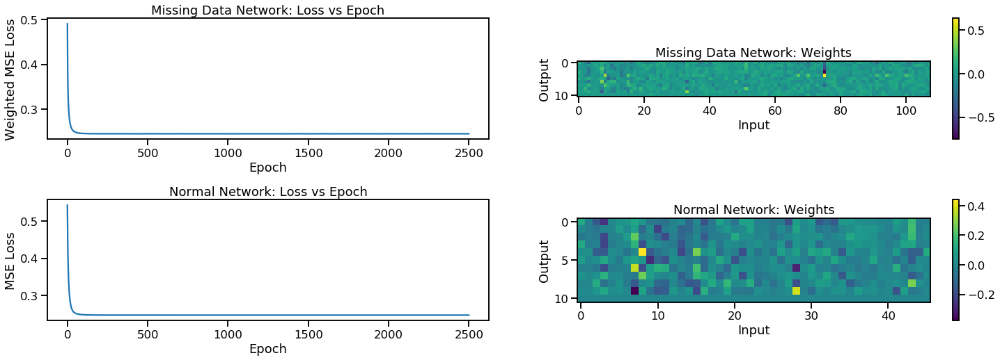

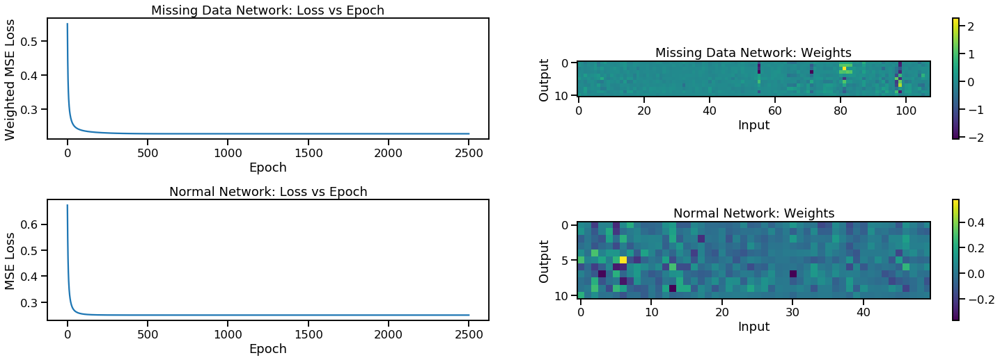

In [13]:
for file,d,d_id,mloss, nmloss, mweight, nmweight in zip(files,data,dataset_id,mdecode_loss_list, nmdecode_loss_list, mdecode_weight_list, nmdecode_weight_list): 
    grid_kws = {"height_ratios": (1,1), "hspace": 0.5}
    f,axes = plt.subplots(2,2,sharex=False, gridspec_kw=grid_kws, figsize=(25,8))
    axes[0,0].set_title('Missing Data Network: Loss vs Epoch')  
    axes[0,0].plot(mloss)
    axes[0,0].set_ylabel('Weighted MSE Loss')
    axes[0,0].set_xlabel('Epoch')
    axes[1,0].set_title('Normal Network: Loss vs Epoch')
    axes[1,0].plot(nmloss)
    axes[1,0].set_ylabel('MSE Loss')
    axes[1,0].set_xlabel('Epoch')
    axes[0,1].set_title('Missing Data Network: Weights')
    im1 = axes[0,1].imshow(mweight[0])
    axes[0,1].set_ylabel('Output')
    axes[0,1].set_xlabel('Input')
    f.colorbar(im1, ax = axes[0,1])
    im2 = axes[1,1].imshow(nmweight[0])
    axes[1,1].set_title('Normal Network: Weights')
    axes[1,1].set_ylabel('Output')
    axes[1,1].set_xlabel('Input')
    f.colorbar(im2, ax = axes[1,1])


/groups/turaga/home/xur/miniconda3/envs/cel/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


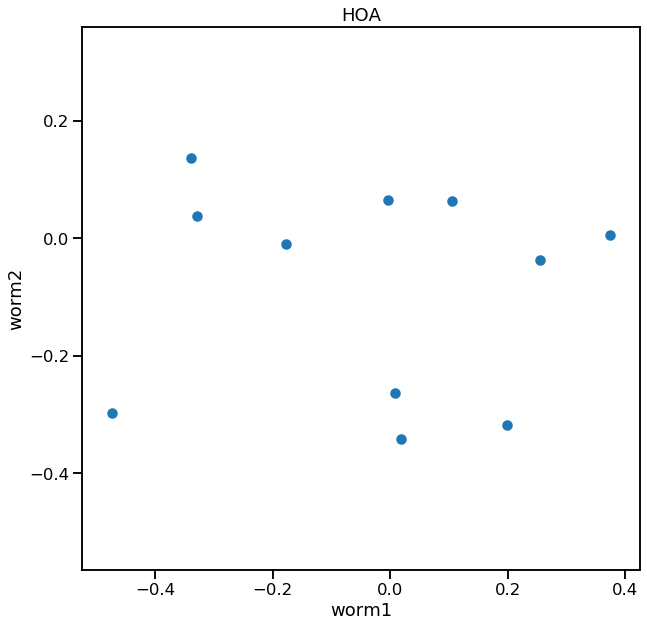

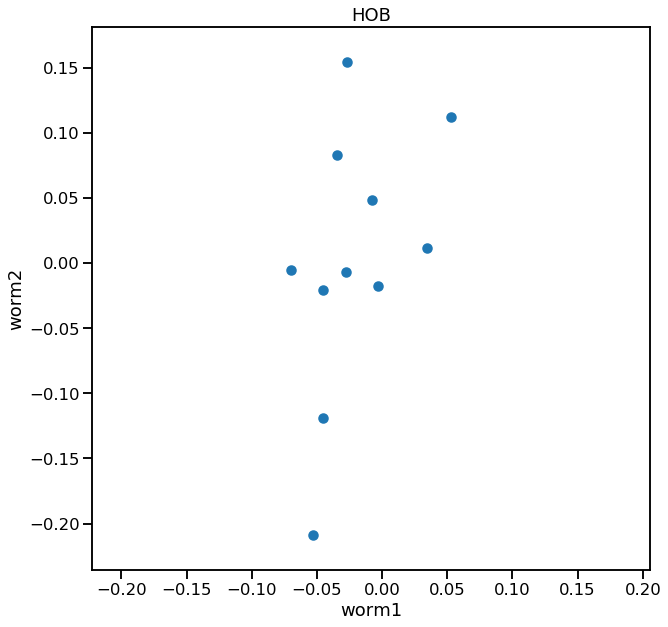

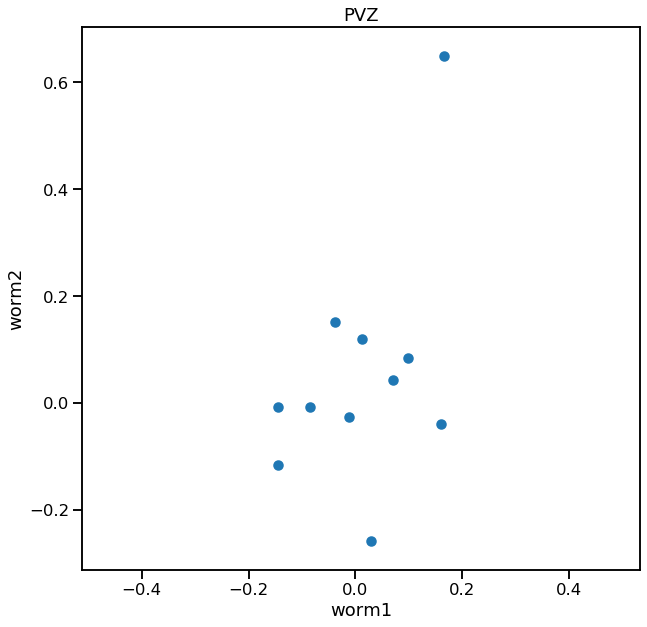

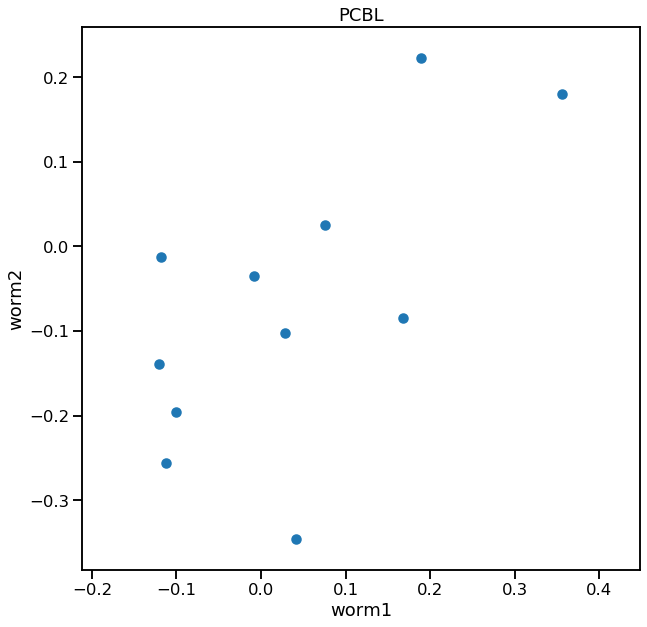

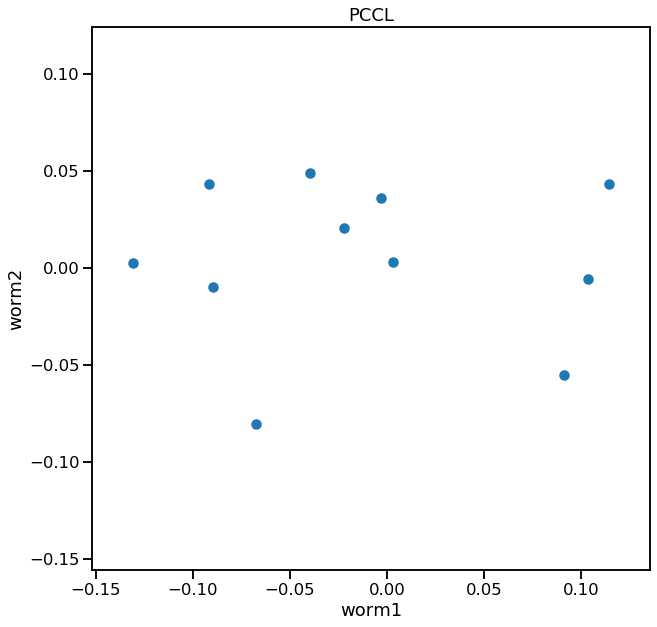

...

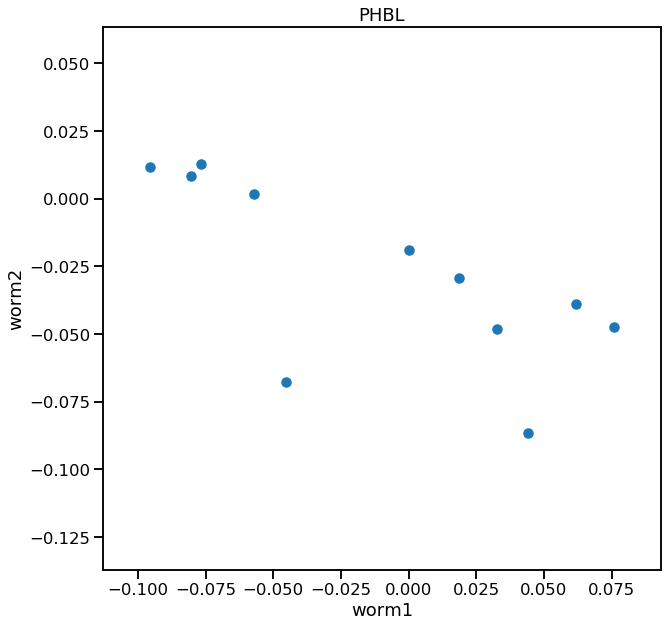

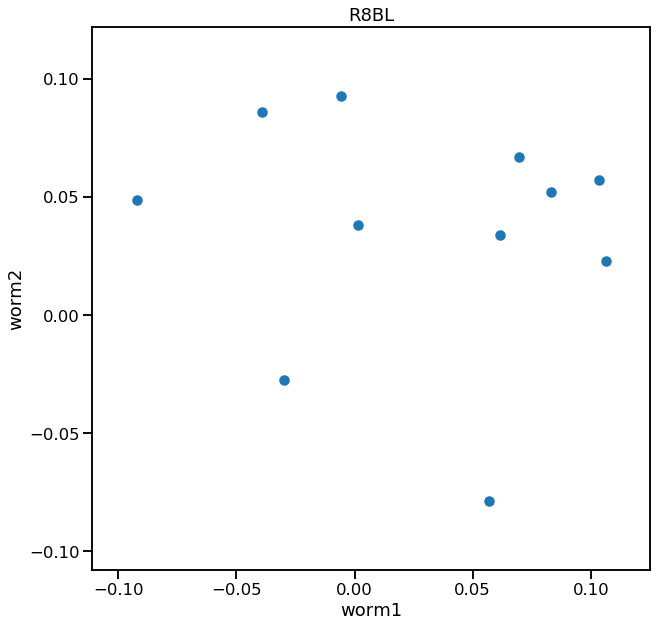

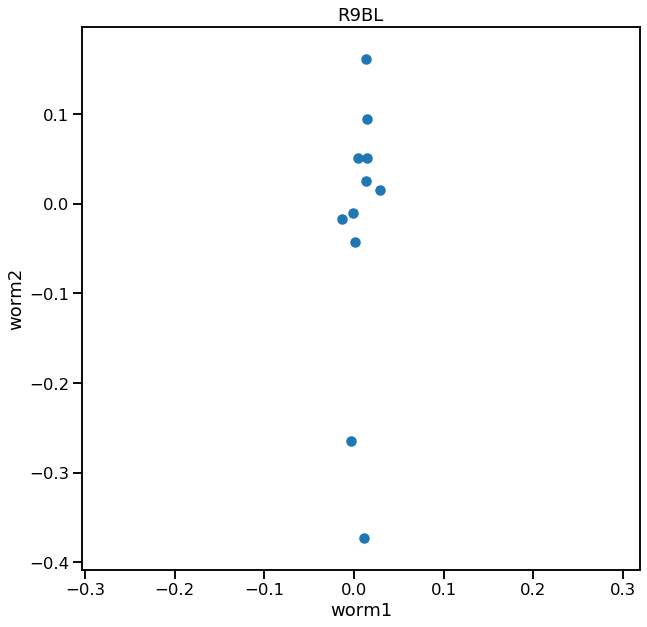

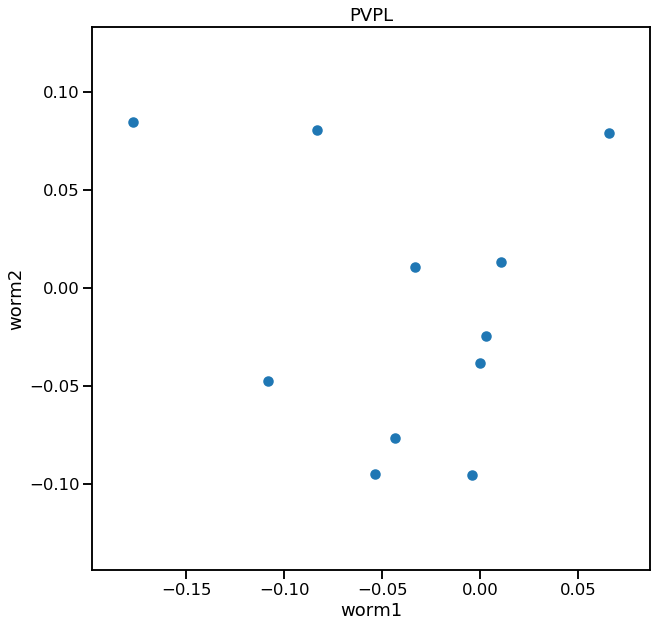

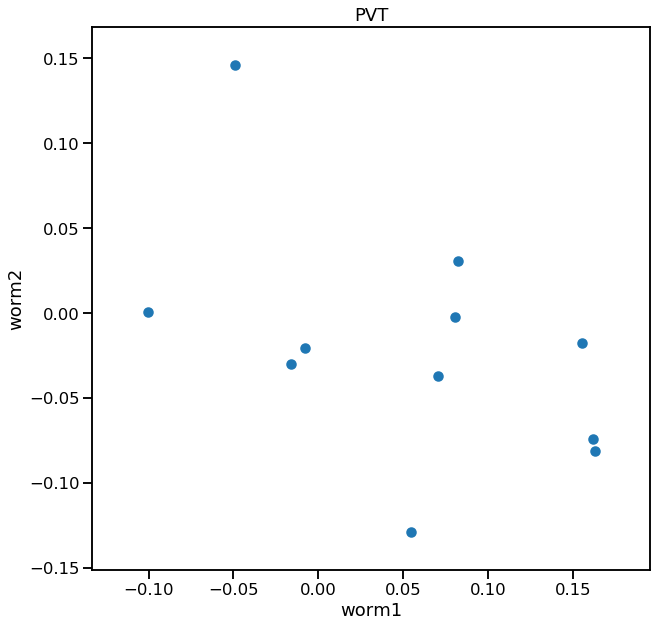

In [14]:
for i in range(len(activity_list)):
    plt.figure(figsize = (10,10))
    plt.title(activity_list[i])
    row_weights1 = mdecode_weight_list[0][0][:,i]
    row_weights2 = mdecode_weight_list[2][0][:,i]
    plt.scatter(row_weights1,row_weights2)
    plt.axis('equal')
    plt.xlabel('worm1')
    plt.ylabel('worm2')

In [15]:

# Attempt at making a heat map that shows correlations between neurons and behavior data. Doesn't work well because
# too many of the correlations end up becoming NaN's. Getting ValueError: zero-size array to reduction operation 
# minimum which has no identity
# 
# for file,d,d_id,output in zip(files,data,dataset_id,decode_output_list):
#     od_bev = pd.DataFrame(data = output, columns = behavior_list)
#     d_bev, d_act = d[behavior_list], d[activity_list]
#     od_bev[['TailAngle','pos_x','pos_y']] = od_bev[['TailAngle','pos_x','pos_y']]*100
#     act_drop, bev_drop = d_act.dropna(axis=1,how = 'all'),d_bev.dropna(axis = 1,how = 'all')
#     act_matrix, bev_matrix = act_drop.values,bev_drop.values
#     Nd = act_matrix.shape[1] # number of neurons after dropping Nans
#     T = act_matrix.shape[0] # number of images
#     O = bev_matrix.shape[1] # number of behavioral data types  
#     Na = len(activity_list) #total number of neurons
    
#     corr_matrix = np.ndarray(shape = (Nd,O))
#     for i,( neuron, act_data) in enumerate(act_drop.iteritems()):
#         for j, (behavior, bev_data) in enumerate(od_bev.iteritems()):
#             activity = act_data.as_matrix()
#             behavior = bev_data.as_matrix()
#             corr_matrix[i,j] = np.inner(activity,behavior)/(np.linalg.norm(activity)*np.linalg.norm(behavior))
#     sns.heatmap(corr_matrix)    

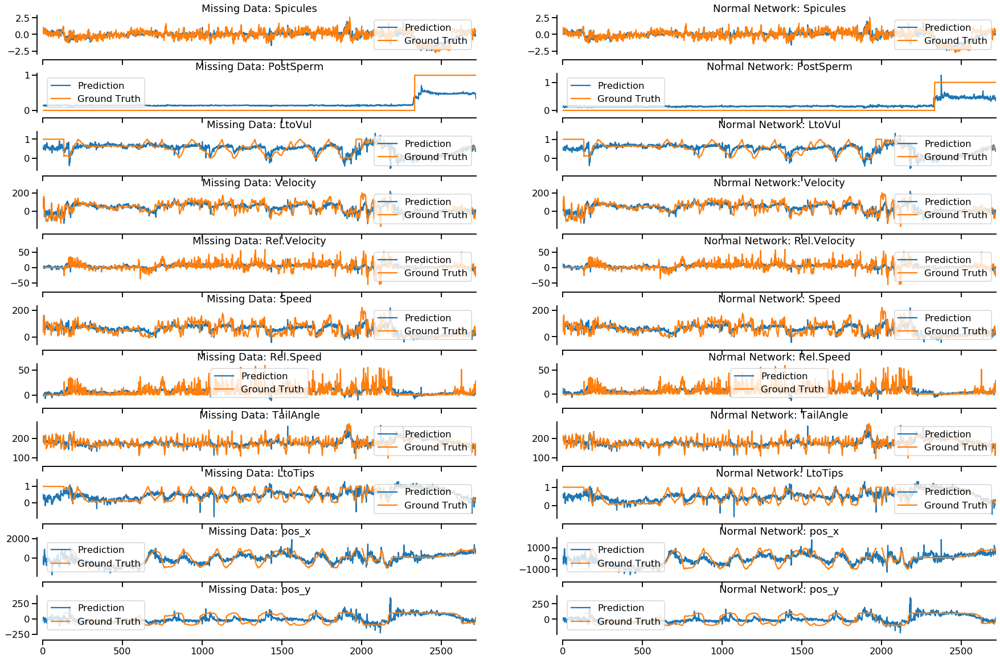

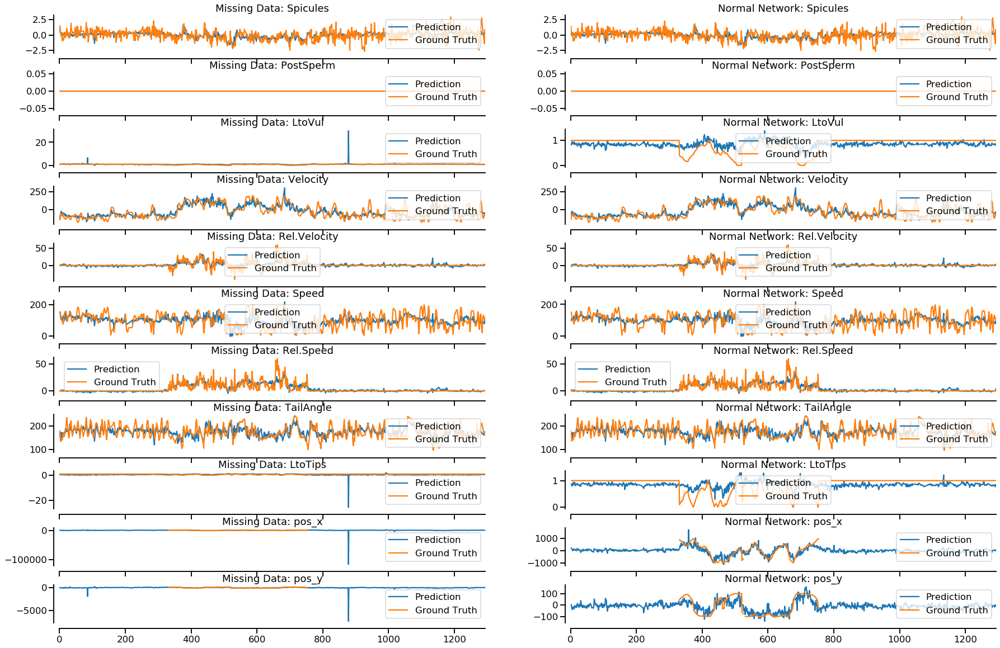

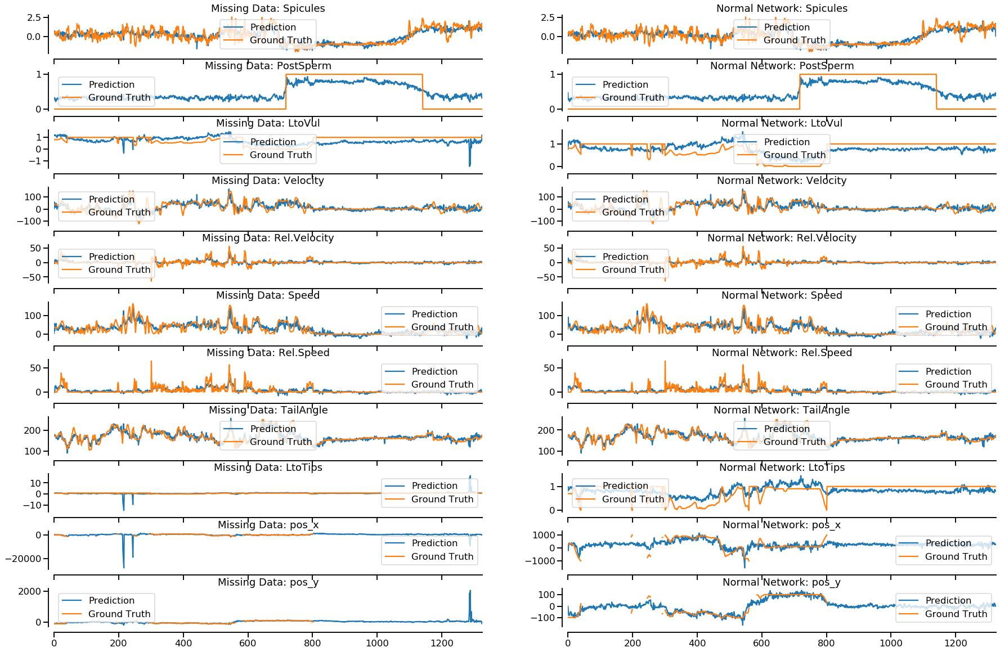

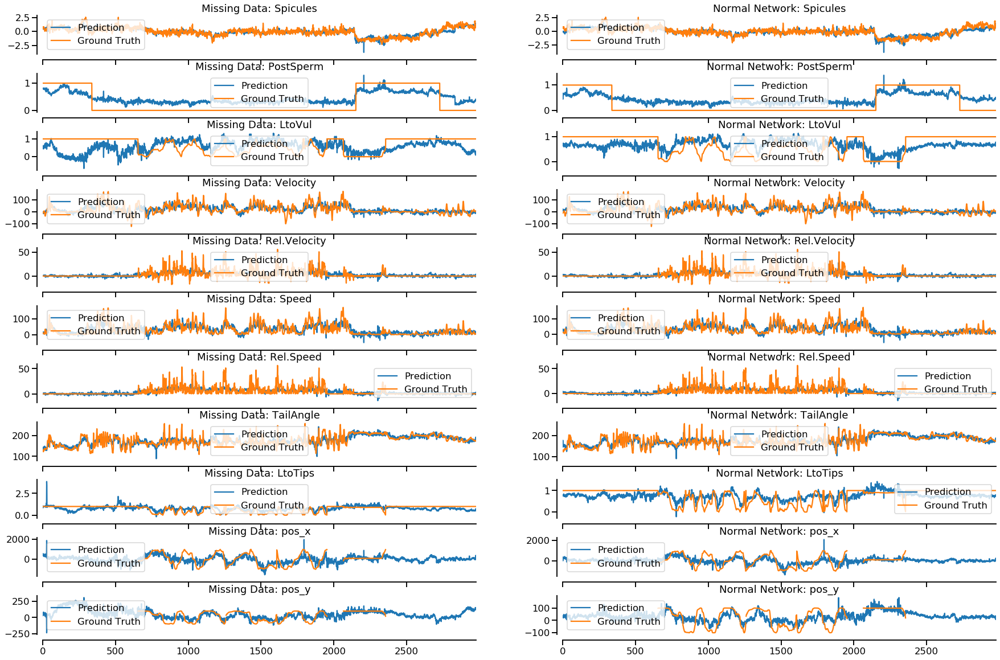

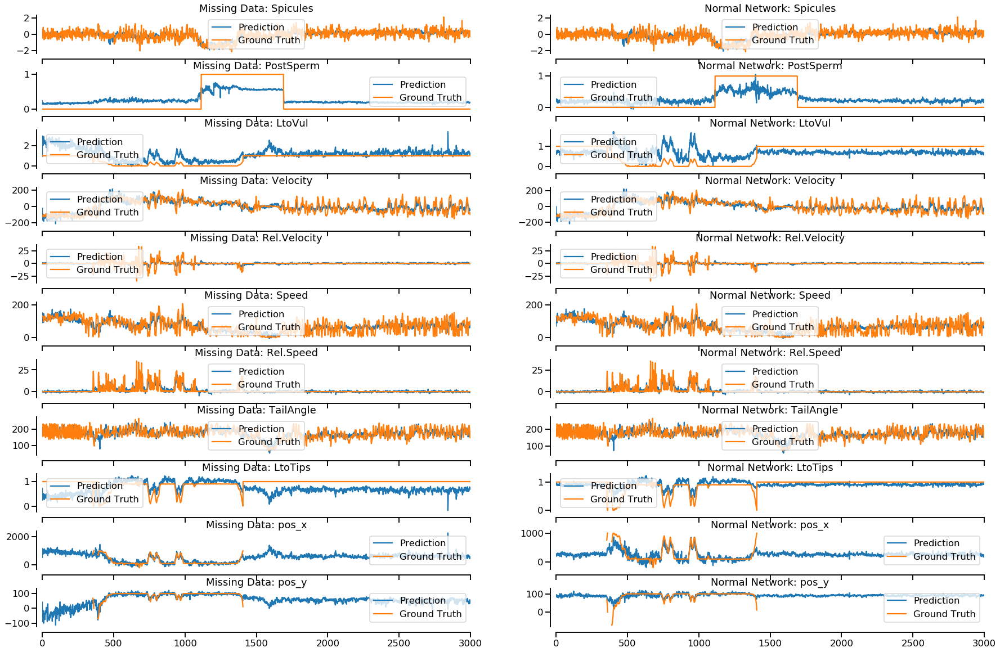

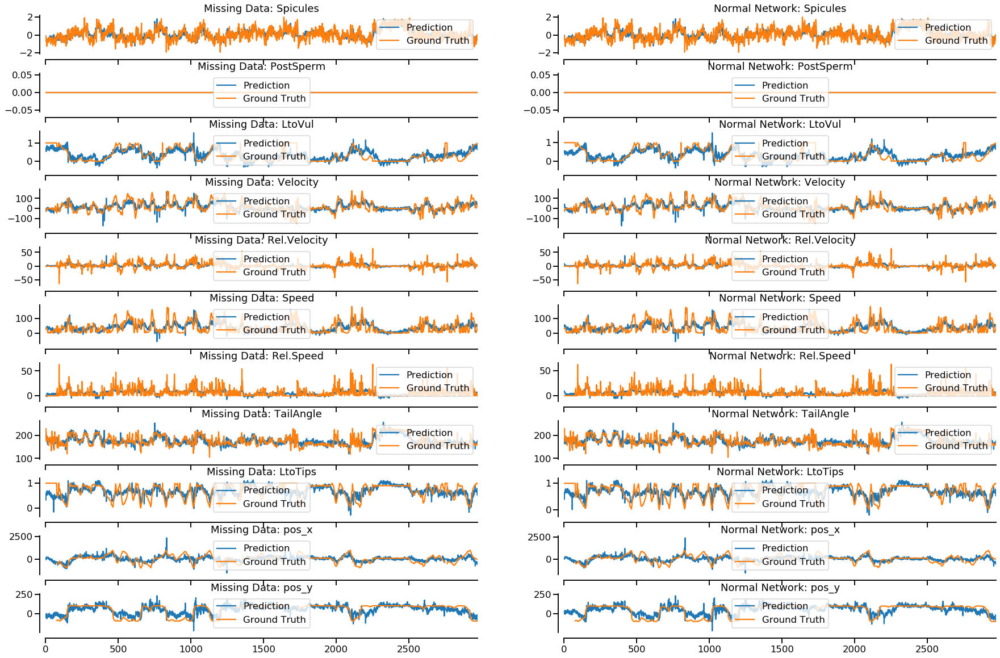

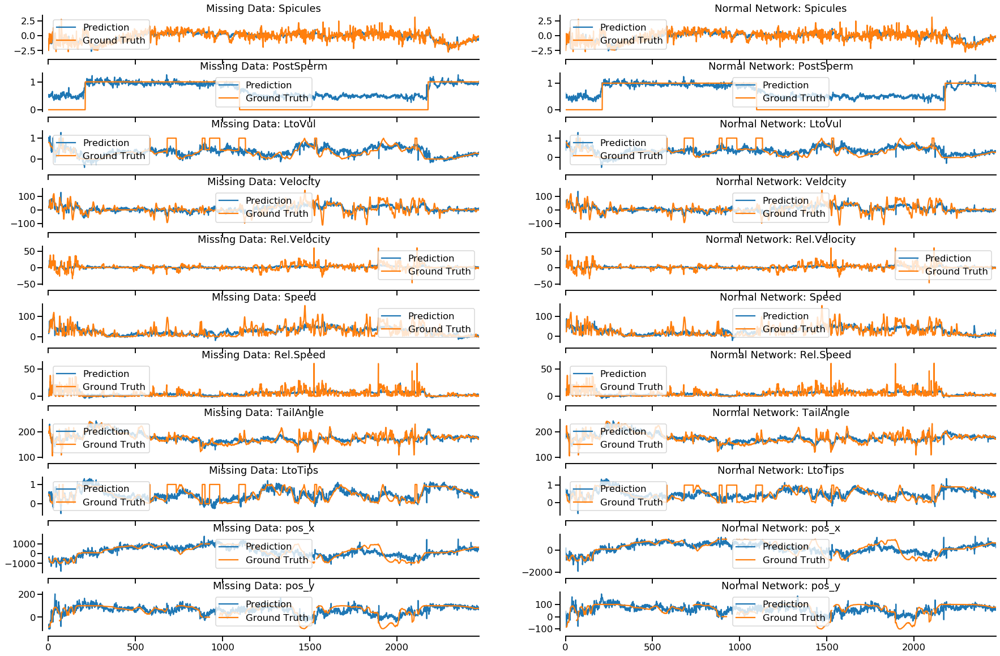

In [16]:
for file,d,d_id,moutput, nmoutput in zip(files,data,dataset_id,mdecode_output_list, nmdecode_output_list):
    mod_bev = pd.DataFrame(data = moutput, columns = behavior_list)
    nmod_bev = pd.DataFrame(data = nmoutput, columns = behavior_list)
    d_bev = d[behavior_list]
    mod_bev = mod_bev*d_bev.std() + d_bev.mean()
    nmod_bev = nmod_bev*d_bev.std() + d_bev.mean()
    grid_kws = {"hspace": 0.5}
    f,axes = plt.subplots(11,2,sharex=True,gridspec_kw = grid_kws, figsize=(30,20))
    axes[0,0].set_title('Missing Data Network output: file: {}, dataset id: {}'.format(file,d_id))
    axes[0,1].set_title('Normal Network output: file: {}, dataset id: {}'.format(file,d_id))
    mod_bev[['Spicules']].plot(ax=axes[0,0], title = 'Missing Data: Spicules')
    d_bev[['Spicules']].plot(ax=axes[0,0])
    axes[0,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['Spicules']].plot(ax=axes[0,1], title = 'Normal Network: Spicules')
    d_bev[['Spicules']].plot(ax=axes[0,1])
    axes[0,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['PostSperm']].plot(ax=axes[1,0], title = 'Missing Data: PostSperm')
    d_bev[['PostSperm']].plot(ax=axes[1,0])
    axes[1,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['PostSperm']].plot(ax=axes[1,1], title = 'Normal Network: PostSperm')
    d_bev[['PostSperm']].plot(ax=axes[1,1])
    axes[1,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['LtoVul']].plot(ax=axes[2,0], title = 'Missing Data: LtoVul')
    d_bev[['LtoVul']].plot(ax=axes[2,0])
    axes[2,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['LtoVul']].plot(ax=axes[2,1], title = 'Normal Network: LtoVul')
    d_bev[['LtoVul']].plot(ax=axes[2,1])
    axes[2,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['Velocity']].plot(ax=axes[3,0], title = 'Missing Data: Velocity')
    d_bev[['Velocity']].plot(ax=axes[3,0])
    axes[3,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['Velocity']].plot(ax=axes[3,1], title = 'Normal Network: Velocity')
    d_bev[['Velocity']].plot(ax=axes[3,1])
    axes[3,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['Rel.Velocity']].plot(ax=axes[4,0],title = 'Missing Data: Rel.Velocity')
    d_bev[['Rel.Velocity']].plot(ax=axes[4,0])
    axes[4,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['Rel.Velocity']].plot(ax=axes[4,1],title = 'Normal Network: Rel.Velocity')
    d_bev[['Rel.Velocity']].plot(ax=axes[4,1])
    axes[4,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['Speed']].plot(ax=axes[5,0],title = 'Missing Data: Speed')
    d_bev[['Speed']].plot(ax=axes[5,0])
    axes[5,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['Speed']].plot(ax=axes[5,1],title = 'Normal Network: Speed')
    d_bev[['Speed']].plot(ax=axes[5,1])
    axes[5,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['Rel.Speed']].plot(ax=axes[6,0],title = 'Missing Data: Rel.Speed')
    d_bev[['Rel.Speed']].plot(ax=axes[6,0])
    axes[6,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['Rel.Speed']].plot(ax=axes[6,1],title = 'Normal Network: Rel.Speed')
    d_bev[['Rel.Speed']].plot(ax=axes[6,1])
    axes[6,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['TailAngle']].plot(ax=axes[7,0],title = 'Missing Data: TailAngle')
    d_bev[['TailAngle']].plot(ax=axes[7,0])
    axes[7,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['TailAngle']].plot(ax=axes[7,1],title = 'Normal Network: TailAngle')
    d_bev[['TailAngle']].plot(ax=axes[7,1])
    axes[7,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['LtoTips']].plot(ax=axes[8,0],title = 'Missing Data: LtoTips')
    d_bev[['LtoTips']].plot(ax=axes[8,0])
    axes[8,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['LtoTips']].plot(ax=axes[8,1],title = 'Normal Network: LtoTips')
    d_bev[['LtoTips']].plot(ax=axes[8,1])
    axes[8,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['pos_x']].plot(ax=axes[9,0],title = 'Missing Data: pos_x')
    d_bev[['pos_x']].plot(ax=axes[9,0])
    axes[9,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['pos_x']].plot(ax=axes[9,1],title = 'Normal Network: pos_x')
    d_bev[['pos_x']].plot(ax=axes[9,1])
    axes[9,1].legend(['Prediction', 'Ground Truth'])
    mod_bev[['pos_y']].plot(ax=axes[10,0],title = 'Missing Data: pos_y')
    d_bev[['pos_y']].plot(ax=axes[10,0])
    axes[10,0].legend(['Prediction', 'Ground Truth'])
    nmod_bev[['pos_y']].plot(ax=axes[10,1],title = 'Normal Network: pos_y')
    d_bev[['pos_y']].plot(ax=axes[10,1])
    axes[10,1].legend(['Prediction', 'Ground Truth'])
    sns.despine(offset=10)

Dataset: datasub714, Input dimension: 54, Output dimension:  11, T: 11315


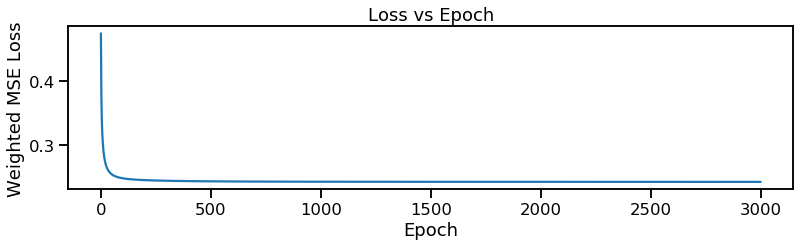

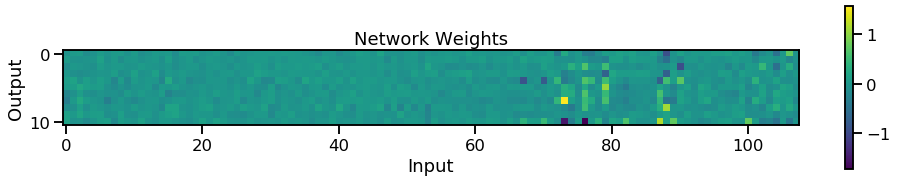

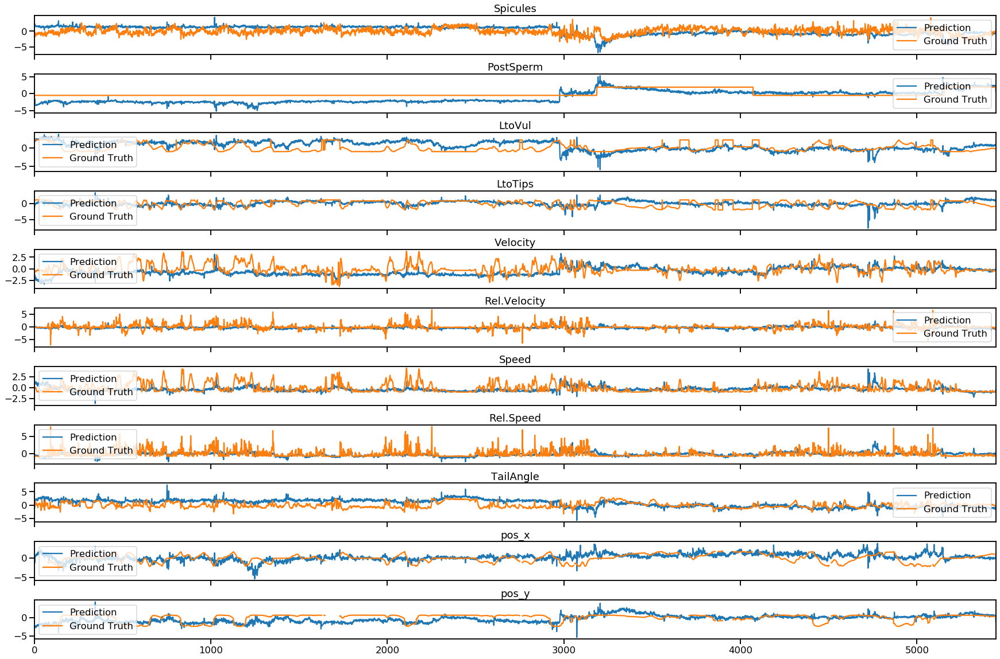

In [17]:
trainframe_list = [data[i] for i in range(5)]
train_df = pd.concat(trainframe_list)
testframe_list = [data[i] for i in range(5,7)]
test_df = pd.concat(testframe_list)
train_df = (train_df - train_df.mean())/(train_df.std())
test_df = (test_df - test_df.mean())/(test_df.std())

in_actdata = train_df[activity_list]
in_bevdata = train_df[behavior_list]
out_actdata = test_df[activity_list]
out_bevdata = test_df[behavior_list]

act_matrix, bev_matrix = in_actdata.values, in_bevdata.values
miss_act, miss_bev = np.zeros(act_matrix.shape), np.zeros(bev_matrix.shape) # initialize arrays for denoting missing values
miss_act[np.isnan(act_matrix)], miss_bev[np.isnan(bev_matrix)] = 1,1 # fill missing arrays with 1 for NaN values
act_matrix[np.isnan(act_matrix)], bev_matrix[np.isnan(bev_matrix)] = 0,0
N, T, O = act_matrix.shape[1], act_matrix.shape[0], bev_matrix.shape[1]
print("Dataset: " + str(file) + ", Input dimension: " + str(N)+ ", Output dimension:  " + str(O)+ ", T: " + str(T))
epochs = 3000
output = np.ndarray(shape = bev_matrix.shape)
decode_net = Net(n_feature = 2*N, n_output = O)
decode_net.cuda()
decode_loss = decode_net.mtrain(act_matrix, miss_act, bev_matrix, miss_bev, learning_rate = 5e-4, epochs = epochs, batch_size = 128)

act_matrix = out_actdata.values 
miss_act = np.zeros(act_matrix.shape)
miss_act[np.isnan(act_matrix)] = 1
act_matrix[np.isnan(act_matrix)] = 0
output_ndarr = decode_net.mpredict(in_data = act_matrix, missing_in = miss_act).detach().numpy()
decode_weights = [p.detach().cpu().numpy() for p in decode_net.parameters()]

plt.figure(figsize=(13,3))
plt.plot(decode_loss)
plt.title('Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Weighted MSE Loss')
plt.show()

#print(decode_weights)
plt.figure(figsize=(16.5,3))
plt.imshow(decode_weights[0])
plt.colorbar()
plt.title('Network Weights')
plt.ylabel('Output')
plt.xlabel('Input')
plt.show()

od_bev = pd.DataFrame(data = output_ndarr, columns = behavior_list)
test_bev = pd.DataFrame(data = test_df[behavior_list].values, columns = behavior_list)
bevpred = od_bev*test_bev.std() + test_bev.mean()
grid_kws = {"hspace": 0.5}
f,axes = plt.subplots(11,1,sharex=True,gridspec_kw = grid_kws, figsize=(30,20))
axes[0].set_title('Linear Network that accounts for missing data. Trained on first 5 worms and tested on last 2.')
bevpred[['Spicules']].plot(ax=axes[0], title = 'Spicules')
test_bev[['Spicules']].plot(ax=axes[0])
axes[0].legend(['Prediction', 'Ground Truth'])
bevpred[['PostSperm']].plot(ax=axes[1], title = 'PostSperm')
test_bev[['PostSperm']].plot(ax=axes[1])
axes[1].legend(['Prediction', 'Ground Truth'])
bevpred[['LtoVul']].plot(ax=axes[2], title = 'LtoVul')
test_bev[['LtoVul']].plot(ax=axes[2])
axes[2].legend(['Prediction', 'Ground Truth'])
bevpred[['LtoTips']].plot(ax=axes[3], title = 'LtoTips')
test_bev[['LtoTips']].plot(ax=axes[3])
axes[3].legend(['Prediction', 'Ground Truth'])
bevpred[['Velocity']].plot(ax=axes[4], title = 'Velocity')
test_bev[['Velocity']].plot(ax=axes[4])
axes[4].legend(['Prediction', 'Ground Truth'])
bevpred[['Rel.Velocity']].plot(ax=axes[5], title = 'Rel.Velocity')
test_bev[['Rel.Velocity']].plot(ax=axes[5])
axes[5].legend(['Prediction', 'Ground Truth'])
bevpred[['Speed']].plot(ax=axes[6], title = 'Speed')
test_bev[['Speed']].plot(ax=axes[6])
axes[6].legend(['Prediction', 'Ground Truth'])
bevpred[['Rel.Speed']].plot(ax=axes[7], title = 'Rel.Speed')
test_bev[['Rel.Speed']].plot(ax=axes[7])
axes[7].legend(['Prediction', 'Ground Truth'])
bevpred[['TailAngle']].plot(ax=axes[8], title = 'TailAngle')
test_bev[['TailAngle']].plot(ax=axes[8])
axes[8].legend(['Prediction', 'Ground Truth'])
bevpred[['pos_x']].plot(ax=axes[9], title = 'pos_x')
test_bev[['pos_x']].plot(ax=axes[9])
axes[9].legend(['Prediction', 'Ground Truth'])
bevpred[['pos_y']].plot(ax=axes[10], title = 'pos_y')
test_bev[['pos_y']].plot(ax=axes[10])
axes[10].legend(['Prediction', 'Ground Truth'])


Dataset: datasub714, Input dimension: 54, Output dimension:  11, T: 12750


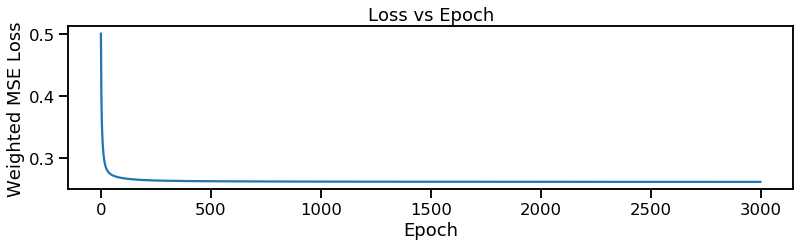

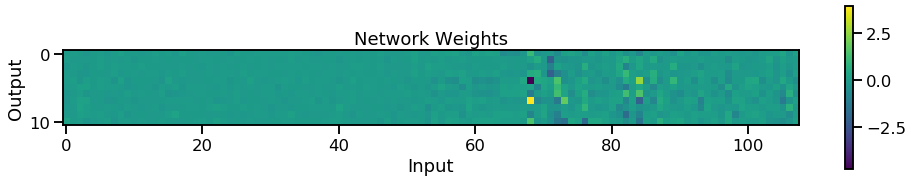

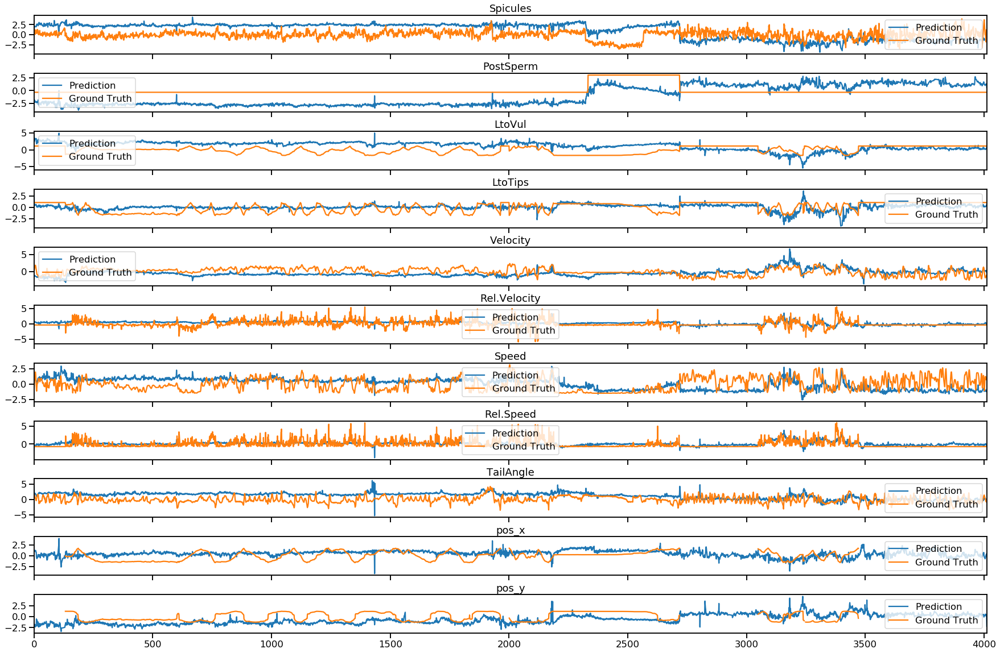

In [18]:
trainframe_list = [data[i] for i in [2,3,4,5,6]]
train_df = pd.concat(trainframe_list)
testframe_list = [data[i] for i in [0,1]]
test_df = pd.concat(testframe_list)
train_df = (train_df - train_df.mean())/(train_df.std())
test_df = (test_df - test_df.mean())/(test_df.std())

in_actdata = train_df[activity_list]
in_bevdata = train_df[behavior_list]
out_actdata = test_df[activity_list]
out_bevdata = test_df[behavior_list]

act_matrix, bev_matrix = in_actdata.values, in_bevdata.values
miss_act, miss_bev = np.zeros(act_matrix.shape), np.zeros(bev_matrix.shape) # initialize arrays for denoting missing values
miss_act[np.isnan(act_matrix)], miss_bev[np.isnan(bev_matrix)] = 1,1 # fill missing arrays with 1 for NaN values
act_matrix[np.isnan(act_matrix)], bev_matrix[np.isnan(bev_matrix)] = 0,0
N, T, O = act_matrix.shape[1], act_matrix.shape[0], bev_matrix.shape[1]
print("Dataset: " + str(file) + ", Input dimension: " + str(N)+ ", Output dimension:  " + str(O)+ ", T: " + str(T))
epochs = 3000
output = np.ndarray(shape = bev_matrix.shape)
decode_net = Net(n_feature = 2*N, n_output = O)
decode_net.cuda()
decode_loss = decode_net.mtrain(act_matrix, miss_act, bev_matrix, miss_bev, learning_rate = 5e-4, epochs = epochs, batch_size = 128)

act_matrix = out_actdata.values 
miss_act = np.zeros(act_matrix.shape)
miss_act[np.isnan(act_matrix)] = 1
act_matrix[np.isnan(act_matrix)] = 0
output_ndarr = decode_net.mpredict(in_data = act_matrix, missing_in = miss_act).detach().numpy()
decode_weights = [p.detach().cpu().numpy() for p in decode_net.parameters()]

plt.figure(figsize=(13,3))
plt.plot(decode_loss)
plt.title('Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Weighted MSE Loss')
plt.show()

#print(decode_weights)
plt.figure(figsize=(16.5,3))
plt.imshow(decode_weights[0])
plt.colorbar()
plt.title('Network Weights')
plt.ylabel('Output')
plt.xlabel('Input')
plt.show()

od_bev = pd.DataFrame(data = output_ndarr, columns = behavior_list)
test_bev = pd.DataFrame(data = test_df[behavior_list].values, columns = behavior_list)
bevpred = od_bev*test_bev.std() + test_bev.mean()
grid_kws = {"hspace": 0.5}
f,axes = plt.subplots(11,1,sharex=True,gridspec_kw = grid_kws, figsize=(30,20))
axes[0].set_title('Linear Network that accounts for missing data. Trained on first 5 worms and tested on last 2.')
bevpred[['Spicules']].plot(ax=axes[0], title = 'Spicules')
test_bev[['Spicules']].plot(ax=axes[0])
axes[0].legend(['Prediction', 'Ground Truth'])
bevpred[['PostSperm']].plot(ax=axes[1], title = 'PostSperm')
test_bev[['PostSperm']].plot(ax=axes[1])
axes[1].legend(['Prediction', 'Ground Truth'])
bevpred[['LtoVul']].plot(ax=axes[2], title = 'LtoVul')
test_bev[['LtoVul']].plot(ax=axes[2])
axes[2].legend(['Prediction', 'Ground Truth'])
bevpred[['LtoTips']].plot(ax=axes[3], title = 'LtoTips')
test_bev[['LtoTips']].plot(ax=axes[3])
axes[3].legend(['Prediction', 'Ground Truth'])
bevpred[['Velocity']].plot(ax=axes[4], title = 'Velocity')
test_bev[['Velocity']].plot(ax=axes[4])
axes[4].legend(['Prediction', 'Ground Truth'])
bevpred[['Rel.Velocity']].plot(ax=axes[5], title = 'Rel.Velocity')
test_bev[['Rel.Velocity']].plot(ax=axes[5])
axes[5].legend(['Prediction', 'Ground Truth'])
bevpred[['Speed']].plot(ax=axes[6], title = 'Speed')
test_bev[['Speed']].plot(ax=axes[6])
axes[6].legend(['Prediction', 'Ground Truth'])
bevpred[['Rel.Speed']].plot(ax=axes[7], title = 'Rel.Speed')
test_bev[['Rel.Speed']].plot(ax=axes[7])
axes[7].legend(['Prediction', 'Ground Truth'])
bevpred[['TailAngle']].plot(ax=axes[8], title = 'TailAngle')
test_bev[['TailAngle']].plot(ax=axes[8])
axes[8].legend(['Prediction', 'Ground Truth'])
bevpred[['pos_x']].plot(ax=axes[9], title = 'pos_x')
test_bev[['pos_x']].plot(ax=axes[9])
axes[9].legend(['Prediction', 'Ground Truth'])
bevpred[['pos_y']].plot(ax=axes[10], title = 'pos_y')
test_bev[['pos_y']].plot(ax=axes[10])
axes[10].legend(['Prediction', 'Ground Truth'])

Dataset: datasub714, Input dimension: 54, Output dimension:  11, T: 10786


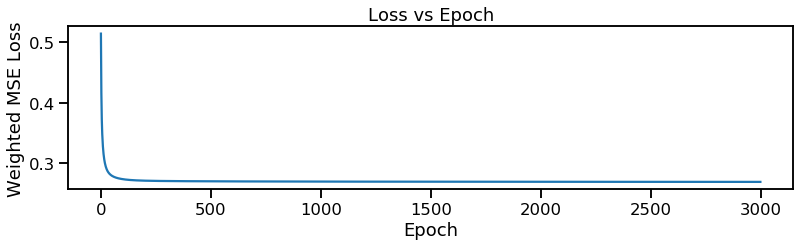

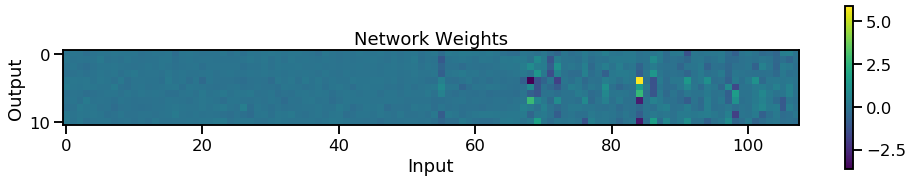

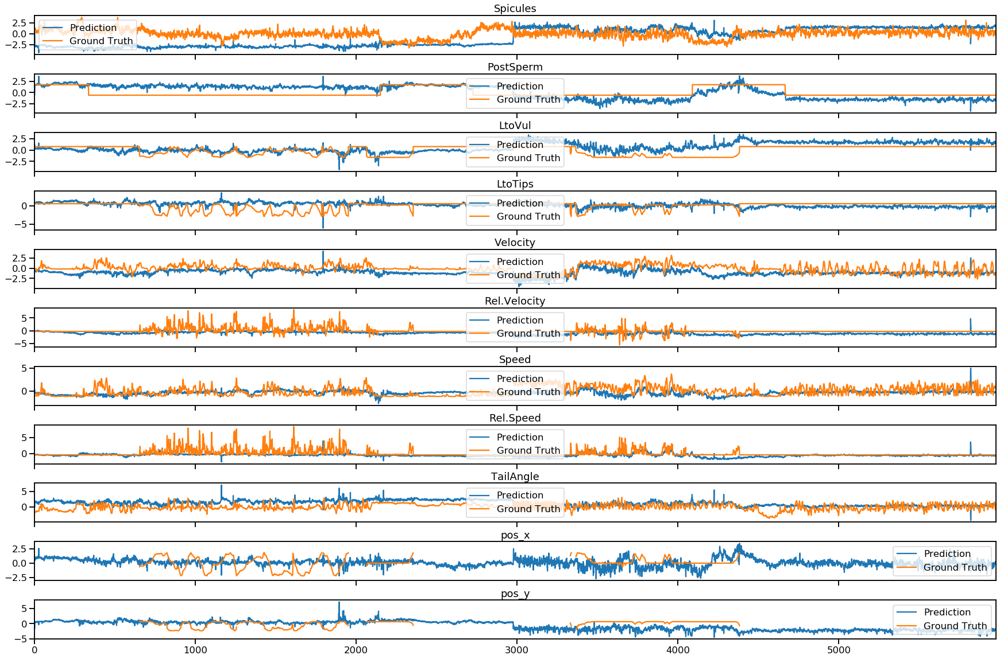

In [19]:
trainframe_list = [data[i] for i in [0,1,2,5,6]]
train_df = pd.concat(trainframe_list)
testframe_list = [data[i] for i in [3,4]]
test_df = pd.concat(testframe_list)
train_df = (train_df - train_df.mean())/(train_df.std())
test_df = (test_df - test_df.mean())/(test_df.std())

in_actdata = train_df[activity_list]
in_bevdata = train_df[behavior_list]
out_actdata = test_df[activity_list]
out_bevdata = test_df[behavior_list]

act_matrix, bev_matrix = in_actdata.values, in_bevdata.values
miss_act, miss_bev = np.zeros(act_matrix.shape), np.zeros(bev_matrix.shape) # initialize arrays for denoting missing values
miss_act[np.isnan(act_matrix)], miss_bev[np.isnan(bev_matrix)] = 1,1 # fill missing arrays with 1 for NaN values
act_matrix[np.isnan(act_matrix)], bev_matrix[np.isnan(bev_matrix)] = 0,0
N, T, O = act_matrix.shape[1], act_matrix.shape[0], bev_matrix.shape[1]
print("Dataset: " + str(file) + ", Input dimension: " + str(N)+ ", Output dimension:  " + str(O)+ ", T: " + str(T))
epochs = 3000
output = np.ndarray(shape = bev_matrix.shape)
decode_net = Net(n_feature = 2*N, n_output = O)
decode_net.cuda()
decode_loss = decode_net.mtrain(act_matrix, miss_act, bev_matrix, miss_bev, learning_rate = 5e-4, epochs = epochs, batch_size = 128)

act_matrix = out_actdata.values 
miss_act = np.zeros(act_matrix.shape)
miss_act[np.isnan(act_matrix)] = 1
act_matrix[np.isnan(act_matrix)] = 0
output_ndarr = decode_net.mpredict(in_data = act_matrix, missing_in = miss_act).detach().numpy()
decode_weights = [p.detach().cpu().numpy() for p in decode_net.parameters()]

plt.figure(figsize=(13,3))
plt.plot(decode_loss)
plt.title('Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Weighted MSE Loss')
plt.show()

#print(decode_weights)
plt.figure(figsize=(16.5,3))
plt.imshow(decode_weights[0])
plt.colorbar()
plt.title('Network Weights')
plt.ylabel('Output')
plt.xlabel('Input')
plt.show()

od_bev = pd.DataFrame(data = output_ndarr, columns = behavior_list)
test_bev = pd.DataFrame(data = test_df[behavior_list].values, columns = behavior_list)
bevpred = od_bev*test_bev.std() + test_bev.mean()
grid_kws = {"hspace": 0.5}
f,axes = plt.subplots(11,1,sharex=True,gridspec_kw = grid_kws, figsize=(30,20))
axes[0].set_title('Linear Network that accounts for missing data. Trained on first 5 worms and tested on last 2.')
bevpred[['Spicules']].plot(ax=axes[0], title = 'Spicules')
test_bev[['Spicules']].plot(ax=axes[0])
axes[0].legend(['Prediction', 'Ground Truth'])
bevpred[['PostSperm']].plot(ax=axes[1], title = 'PostSperm')
test_bev[['PostSperm']].plot(ax=axes[1])
axes[1].legend(['Prediction', 'Ground Truth'])
bevpred[['LtoVul']].plot(ax=axes[2], title = 'LtoVul')
test_bev[['LtoVul']].plot(ax=axes[2])
axes[2].legend(['Prediction', 'Ground Truth'])
bevpred[['LtoTips']].plot(ax=axes[3], title = 'LtoTips')
test_bev[['LtoTips']].plot(ax=axes[3])
axes[3].legend(['Prediction', 'Ground Truth'])
bevpred[['Velocity']].plot(ax=axes[4], title = 'Velocity')
test_bev[['Velocity']].plot(ax=axes[4])
axes[4].legend(['Prediction', 'Ground Truth'])
bevpred[['Rel.Velocity']].plot(ax=axes[5], title = 'Rel.Velocity')
test_bev[['Rel.Velocity']].plot(ax=axes[5])
axes[5].legend(['Prediction', 'Ground Truth'])
bevpred[['Speed']].plot(ax=axes[6], title = 'Speed')
test_bev[['Speed']].plot(ax=axes[6])
axes[6].legend(['Prediction', 'Ground Truth'])
bevpred[['Rel.Speed']].plot(ax=axes[7], title = 'Rel.Speed')
test_bev[['Rel.Speed']].plot(ax=axes[7])
axes[7].legend(['Prediction', 'Ground Truth'])
bevpred[['TailAngle']].plot(ax=axes[8], title = 'TailAngle')
test_bev[['TailAngle']].plot(ax=axes[8])
axes[8].legend(['Prediction', 'Ground Truth'])
bevpred[['pos_x']].plot(ax=axes[9], title = 'pos_x')
test_bev[['pos_x']].plot(ax=axes[9])
axes[9].legend(['Prediction', 'Ground Truth'])
bevpred[['pos_y']].plot(ax=axes[10], title = 'pos_y')
test_bev[['pos_y']].plot(ax=axes[10])
axes[10].legend(['Prediction', 'Ground Truth'])
